In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

import tensorflow as tf
import matplotlib.pyplot as plt
import sklearn.preprocessing
from sklearn.metrics import r2_score
from sklearn.preprocessing import MinMaxScaler, StandardScaler

from keras.layers import Dense,Dropout,LSTM, GRU, SimpleRNN
from keras.layers import TimeDistributed
from keras.layers import Flatten
from keras.layers.convolutional import Conv1D
from keras.layers import ConvLSTM2D
from keras.layers.convolutional import MaxPooling1D
from keras.models import Sequential
from keras.losses import mean_squared_error
from keras.backend import sign
import math
import scipy.io

2022-04-24 01:52:56.030306: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-04-24 01:52:56.030344: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


# Data Processing

In [2]:
data_path = './Data/'

In [3]:
hurricanefile_nhc = data_path+'hurricane.mat'
hurricane_data_nhc = scipy.io.loadmat(hurricanefile_nhc)
hurricane_nhc = hurricane_data_nhc['hurricane']
hurricanefile = data_path+'hurricane_1.mat'
hurricane_data = scipy.io.loadmat(hurricanefile)
hurricane = hurricane_data['hurricane']
forecasts_data_file = data_path+'forecasts_int.mat'
forecasts_data_mat = scipy.io.loadmat(forecasts_data_file)
nhc_forecasts = forecasts_data_mat['NHC']
time_split = forecasts_data_mat['time']
model_forecasts = forecasts_data_mat['X']
ground_truths = forecasts_data_mat['Y']
best_track_file = data_path+'best_track.mat'
best_track_matlab_data = scipy.io.loadmat(best_track_file)
best_track = best_track_matlab_data['best_track']

**General Hyperparameters**

In [4]:
train_test_ratio = 0.8
batch_size = 128

**General Functions**

**Data Creation**

In [179]:
total_timesteps= 24
train_time_steps = 23
test_time_steps = total_timesteps - train_time_steps
number_of_hurricanes = best_track[0].shape[0]
number_of_hurricanes

3111

In [180]:
nhc_hurricane_forecast_dict = {}
nhc_original_dict = {}
test_data_raw = [] 
valid_nhc_forecasts = 0 
for i in range(time_split.shape[0]):
  nhc_hurricane_timesteps = time_split[i][1] - time_split[i][0] + 1
  if  nhc_hurricane_timesteps >= total_timesteps: 
    first_point_index = time_split[i][0] - 1
    prediction_window_start = first_point_index + train_time_steps - 1 
    nhc_forecast = nhc_forecasts[0,1:,prediction_window_start]
    hurricane_name = hurricane_nhc[0][i][0][0]
    if np.nansum(nhc_forecast) > 0:
      nhc_hurricane_forecast_dict[hurricane_name] = nhc_forecast
      nhc_original_dict[hurricane_name] = nhc_forecasts[0,0,prediction_window_start+1:prediction_window_start+test_time_steps+1]
      test_data_raw.append(nhc_forecasts[0,0,first_point_index:first_point_index+total_timesteps])
      valid_nhc_forecasts +=1
    prediction_window_index = prediction_window_start + test_time_steps
    j=1
    while prediction_window_index + test_time_steps < first_point_index+nhc_hurricane_timesteps:
      nhc_forecast = nhc_forecasts[0,1:,prediction_window_index]
      if np.nansum(nhc_forecast) > 0:
        key = hurricane_name+"_"+str(j+1)
        nhc_hurricane_forecast_dict[key] = nhc_forecast
        nhc_original_dict[key] = nhc_forecasts[0,0,prediction_window_index+1:prediction_window_index+test_time_steps+1]
        test_data_raw.append(nhc_forecasts[0,0,prediction_window_index+test_time_steps+1-total_timesteps:prediction_window_index+1+test_time_steps])
        j+=1
        valid_nhc_forecasts +=1
      prediction_window_index = prediction_window_index + test_time_steps
      
valid_nhc_forecasts
# nhc_hurricane_forecast_dict

1253

In [184]:
total_observations = 0 
hurricane_count = 0
for i in range(number_of_hurricanes):
    per_hurricane_observations = best_track[0][i].shape[0]
    if per_hurricane_observations>=total_timesteps: 
        total_observations = total_observations + per_hurricane_observations - total_timesteps +1
        hurricane_count += 1
print("hurricane_count, total_observations:", hurricane_count, total_observations)

train_data = []
test_data = []
nhc_forecast_max = np.zeros(0)
hurricane_original_best_track= {}
nhc_count = 0 
hurricane_serial=0
for i in range(number_of_hurricanes):    
    per_hurricane_observations = best_track[0][i].shape[0]
    temp = []
    if per_hurricane_observations>=total_timesteps:
        for j in range(per_hurricane_observations):
            intensity = best_track[0][i][j][3]
            if j !=0:
              if intensity  < 0 : intensity = best_track[0][i][j-1][3]
            temp.append(intensity)
#             data[hurricane_serial,j]=intensity
        hurricane_serial+=1
    number_of_observations = len(temp)
    windows = 0
    neg_list = sum(n < 0 for n in temp)
    if neg_list>0: continue
    for k in range(0, number_of_observations+1-total_timesteps, test_time_steps):
        current_data = temp[k:k+total_timesteps]
        if k == 0: 
          hurricane_key = hurricane[0][i][0][0]
        else: hurricane_key = hurricane[0][i][0][0]+"_"+str(windows+1)
        if hurricane_key in nhc_hurricane_forecast_dict:
            nhc_count  +=1
        else: train_data.append(current_data)
        windows +=1 
print("Number of Hurricanes:", hurricane_serial)
print("Number of Hurricanes/Observations matched with NHC forecast:", nhc_count)
print("After moving window, number of train data:", len(train_data))

hurricane_count, total_observations: 1504 24384
Number of Hurricanes: 1504
Number of Hurricanes/Observations matched with NHC forecast: 1253
After moving window, number of train data: 23107


**Train, Validate, Test Splits**

In [185]:
train_data = np.array(train_data[0:4000])
test_data = np.array(test_data_raw[0:500])
print("Train and Test Data shape before normalizing/standardizing:", train_data.shape, test_data.shape)

# scaler=MinMaxcaler(feature_range=(0,1))
# train_data=scaler.fit_transform(train_data.reshape(-1,1))
# 
scaler=StandardScaler()
train_data=scaler.fit_transform(train_data.reshape(-1,1))

train_data = train_data.reshape(-1,total_timesteps)
print("Train Data shape after normalizing/standardizing:", train_data.shape)

test_data=scaler.transform(test_data.reshape(-1,1))

test_data = test_data.reshape(-1,total_timesteps)
print("Train and Test Data shape before normalizing/standardizing:", train_data.shape, test_data.shape)

print("Before Validation Data: train vs test", train_data.shape, test_data.shape)

length = int(len(train_data)*0.8)
# random.shuffle(train_data)
val_data= train_data[length:]
train_data = train_data[0:length]
print("After Validation Data (from train data): train vs validation vs test", train_data.shape, val_data.shape, test_data.shape)

Train and Test Data shape before normalizing/standardizing: (4000, 24) (500, 24)
Train Data shape after normalizing/standardizing: (4000, 24)
Train and Test Data shape before normalizing/standardizing: (4000, 24) (500, 24)
Before Validation Data: train vs test (4000, 24) (500, 24)
After Validation Data (from train data): train vs validation vs test (3200, 24) (800, 24) (500, 24)


**Data Preprocessing**

In [186]:
def create_X_data(dataset, time_step=1):
    dataX = []
    for i in range(len(dataset)):
        X_data = dataset[i][0:time_step]
        dataX.append(X_data)
    return np.array(dataX)

def ready_X_data(train_data, val_data, test_data, train_time_steps):
      X_train = create_X_data(train_data, train_time_steps)
      X_val = create_X_data(val_data, train_time_steps)
      X_test = create_X_data(test_data, train_time_steps) 
      # reshape input to be [samples, time steps, features] which is required for LSTM
      X_train =X_train.reshape(X_train.shape[0],X_train.shape[1] , 1)
      X_val =X_val.reshape(X_val.shape[0],X_val.shape[1] , 1)
      X_test = X_test.reshape(X_test.shape[0],X_test.shape[1] , 1)
      
     
      return X_train, X_val , X_test
def create_y_data(dataset, time_step=1):
    dataY = []
    for i in range(len(dataset)):
        y_data = np.max(dataset[i][time_step:])
        dataY.append(y_data)
    return np.array(dataY)

def ready_y_data(train_data, val_data, test_data, train_time_steps):
      y_train = create_y_data(train_data, train_time_steps)
      y_val = create_y_data(val_data, train_time_steps)
      y_test = create_y_data(test_data, train_time_steps )
      y_train =y_train.reshape(-1 , 1)
      y_val =y_val.reshape(-1 , 1)
      y_test = y_test.reshape(-1, 1)

      return y_train.reshape(-1) , y_val.reshape(-1), y_test.reshape(-1) 

In [187]:
X_train, X_val, X_test = ready_X_data(train_data, val_data, test_data, train_time_steps)

y_train , y_val, y_test  = ready_y_data(train_data, val_data, test_data, train_time_steps)

X_train.shape, y_train.shape, X_test.shape, y_test.shape

((3200, 23, 1), (3200,), (500, 23, 1), (500,))

# General Functions

In [188]:
def get_result(model, X_test, y_test, model_name="Test"): 
    print(f"Model - {model_name}:")
    
    predictions = model.predict(X_test)

    model_r2_score = r2_score(y_test, predictions)
    print("R^2 Score:",model_r2_score)
    predictions = predictions.reshape((predictions.shape[0]))
    print("RMSE:",  math.sqrt(mean_squared_error(y_test, predictions)))
    return model.predict(X_test)
def plot_predictions(test, predicted, yLabel="Test", realLabel="Test", predictedLabel="Test", title="Test", xLabel="Test"):
    plt.figure(figsize=(20,8))
    plt.rcParams.update({'font.size': 18})
    plt.plot(test, color='red',label=realLabel)
    plt.plot(predicted, alpha=0.7, color='blue',label=predictedLabel)
    plt.title(title)
    plt.xlabel(xLabel)
    plt.ylabel(yLabel)
    plt.legend()
    plt.show()

### Models in Functions

In [189]:
n_hidden_first = 50

In [190]:
def lstm(X_train,y_train):
    # build LSTM model
    lstm_model = Sequential()

    lstm_model.add(LSTM(n_hidden_first,return_sequences=False,activation="relu", input_shape=(X_train.shape[1],1)))
    lstm_model.add(Dropout(0.15))
    # lstm_model.add(LSTM(10, return_sequences=False))
    # lstm_model.add(Dropout(0.2))

    lstm_model.add(Dense(1))

    lstm_model.summary()

    # train LSTM model
    lstm_model.compile(optimizer="adam",loss="MSE")
    lstm_model.fit(X_train, y_train, epochs=30)
    return lstm_model

In [191]:
def stacked_lstm(X_train,y_train):
# build Stacked_LSTM model
    s_lstm_model = Sequential()

    s_lstm_model.add(LSTM(n_hidden_first,return_sequences=True,activation="relu", input_shape=(X_train.shape[1],1)))
    s_lstm_model.add(Dropout(0.15))
    s_lstm_model.add(LSTM(30, return_sequences=True))
    s_lstm_model.add(Dropout(0.2))
    s_lstm_model.add(LSTM(10, return_sequences=False))
    s_lstm_model.add(Dropout(0.2))
    s_lstm_model.add(Dense(1))
    s_lstm_model.summary()

    s_lstm_model.compile(optimizer="adam",loss="MSE")
    s_lstm_model.fit(X_train, y_train, epochs=15)
    return s_lstm_model

In [192]:
def gru(X_train,y_train):
    # build GRU model
    gru_model = Sequential()

    gru_model.add(GRU(n_hidden_first,activation="tanh", input_shape=(X_train.shape[1],1)))
    gru_model.add(Dropout(0.15))

    gru_model.add(Dense(1))

    gru_model.summary()

    gru_model.compile(optimizer="adam",loss="MSE")
    gru_model.fit(X_train, y_train, epochs=30)
    return gru_model

In [193]:
def rnn(X_train,y_train):
    rnn_model = Sequential()

    rnn_model.add(SimpleRNN(n_hidden_first,activation="tanh", input_shape=(X_train.shape[1],1)))
    rnn_model.add(Dropout(0.15))

    rnn_model.add(Dense(1))

    rnn_model.summary()

    rnn_model.compile(optimizer="adam",loss="MSE")
    rnn_model.fit(X_train, y_train, epochs=30)
    return rnn_model


In [194]:
def cnn(X_train,y_train):
    cnn_model = Sequential()
    cnn_model.add(Conv1D(filters=64, kernel_size=2, activation='relu', input_shape=(X_train.shape[1],1)))
    cnn_model.add(MaxPooling1D(pool_size=2))
    cnn_model.add(Flatten())
    cnn_model.add(Dense(10, activation='relu'))
    cnn_model.add(Dense(1))
    cnn_model.summary()
    cnn_model.compile(optimizer='adam', loss='mse')



    cnn_model.compile(optimizer="adam",loss="MSE")
    cnn_model.fit(X_train, y_train, epochs=30)
    return cnn_model

In [195]:
def cnn_lstm(X_train,y_train):
    n_seq = 1
    X_train_reshaped = X_train.reshape((X_train.shape[0], n_seq, X_train.shape[1], 1))

    cnn_lstm_model = Sequential()
    cnn_lstm_model.add(TimeDistributed(Conv1D(filters=64, kernel_size=1, activation='relu'), input_shape=(None, X_train.shape[1],1)))
    cnn_lstm_model.add(TimeDistributed(MaxPooling1D(pool_size=2)))
    cnn_lstm_model.add(TimeDistributed(Flatten()))
    cnn_lstm_model.add(LSTM(20, activation='relu'))
    cnn_lstm_model.add(Dense(1))

    cnn_lstm_model.summary()
    cnn_lstm_model.compile(optimizer='adam', loss='mse')


    cnn_lstm_model.compile(optimizer="adam",loss="MSE")
    cnn_lstm_model.fit(X_train_reshaped, y_train, epochs=30)
    return cnn_lstm_model

In [196]:
def convlstm(X_train,y_train):
    n_seq = 1
    n_features = 1
    X_train_reshaped = X_train.reshape((X_train.shape[0], n_seq, 1, X_train.shape[1], n_features))

    conv_lstm_model = Sequential()
    conv_lstm_model.add(ConvLSTM2D(filters=64, kernel_size=(1,2), activation='relu', input_shape=(n_seq, 1, X_train.shape[1], n_features)))
    conv_lstm_model.add(Flatten())
    conv_lstm_model.add(Dense(1))
    conv_lstm_model.summary()

    conv_lstm_model.compile(optimizer="adam",loss="MSE")
    conv_lstm_model.fit(X_train_reshaped, y_train, epochs=30)
    return conv_lstm_model


# Training and fitting models

In [197]:
yLabel="Hurricane Intensity"
realLabel="Actual Hurricane Intensity"
predictedLabel="Predicted Hurricane Intensity"

Model: "sequential_35"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_32 (LSTM)              (None, 50)                10400     
                                                                 
 dropout_37 (Dropout)        (None, 50)                0         
                                                                 
 dense_39 (Dense)            (None, 1)                 51        
                                                                 
Total params: 10,451
Trainable params: 10,451
Non-trainable params: 0
_________________________________________________________________
Epoch 1/30
100/100 [==============================] - 1s 6ms/step - loss: 0.5250
Epoch 2/30
100/100 [==============================] - 1s 7ms/step - loss: 0.2208
Epoch 3/30
100/100 [==============================] - 1s 8ms/step - loss: 0.1657
Epoch 4/30
100/100 [==============================] - 1s 9ms/step - lo

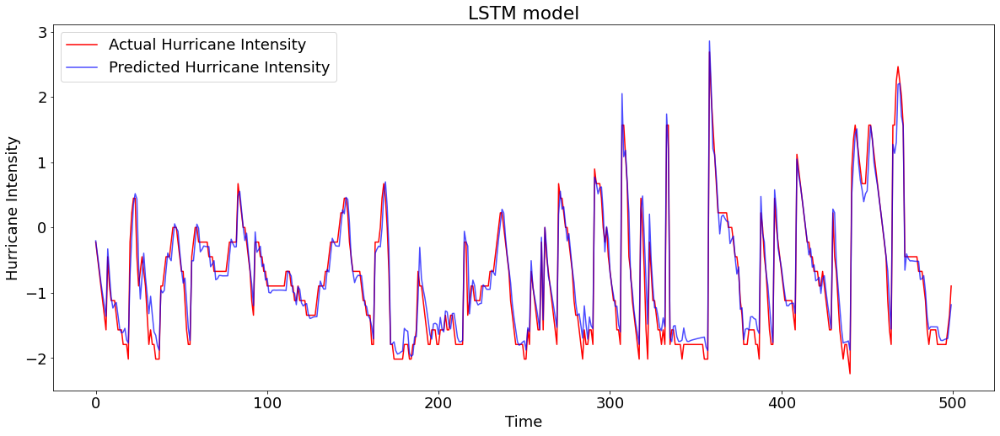

In [198]:
# build LSTM model
lstm_model=lstm(X_train,y_train)
lstm_predictions = get_result(lstm_model, X_test, y_test, "LSTM")
plot_predictions(y_test, lstm_predictions, yLabel, realLabel, predictedLabel, "LSTM model", xLabel="Time")

Model: "sequential_36"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_33 (LSTM)              (None, 23, 50)            10400     
                                                                 
 dropout_38 (Dropout)        (None, 23, 50)            0         
                                                                 
 lstm_34 (LSTM)              (None, 23, 30)            9720      
                                                                 
 dropout_39 (Dropout)        (None, 23, 30)            0         
                                                                 
 lstm_35 (LSTM)              (None, 10)                1640      
                                                                 
 dropout_40 (Dropout)        (None, 10)                0         
                                                                 
 dense_40 (Dense)            (None, 1)               

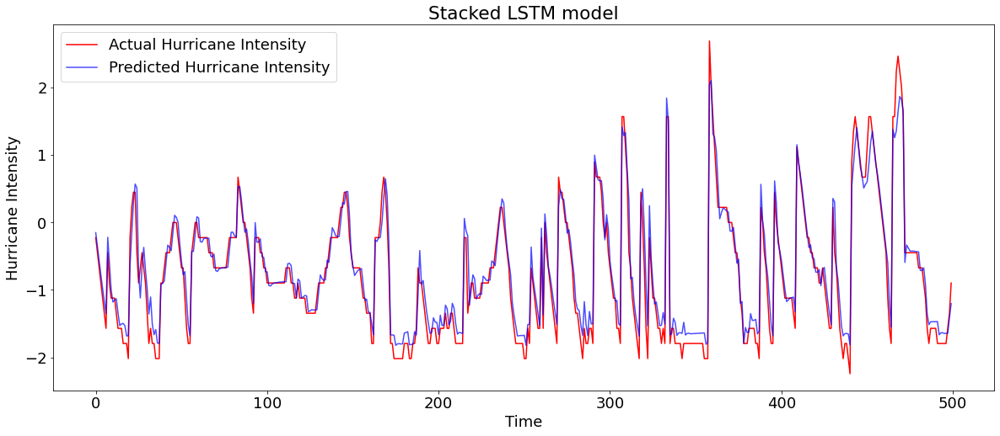

In [199]:
# build Stacked_LSTM model
s_lstm_model = stacked_lstm(X_train,y_train)

s_lstm_predictions = get_result(s_lstm_model, X_test, y_test, "Stacked LSTM")
plot_predictions(y_test, s_lstm_predictions, yLabel, realLabel, predictedLabel, "Stacked LSTM model", xLabel="Time")

Model: "sequential_37"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_5 (GRU)                 (None, 50)                7950      
                                                                 
 dropout_41 (Dropout)        (None, 50)                0         
                                                                 
 dense_41 (Dense)            (None, 1)                 51        
                                                                 
Total params: 8,001
Trainable params: 8,001
Non-trainable params: 0
_________________________________________________________________
Epoch 1/30
100/100 [==============================] - 2s 6ms/step - loss: 0.5587
Epoch 2/30
100/100 [==============================] - 1s 6ms/step - loss: 0.1388
Epoch 3/30
100/100 [==============================] - 1s 6ms/step - loss: 0.0944
Epoch 4/30
100/100 [==============================] - 1s 7ms/step - loss

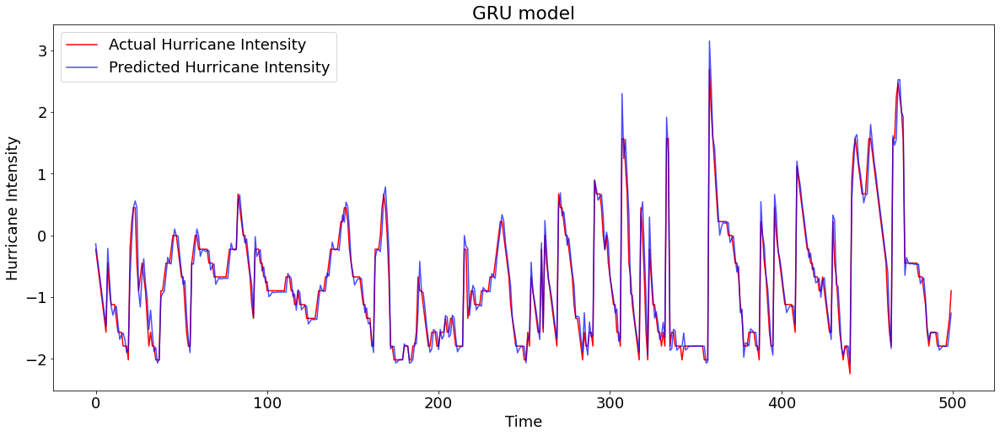

In [200]:
gru_model=gru(X_train,y_train)
gru_predictions = get_result(gru_model, X_test, y_test, "GRU")
plot_predictions(y_test, gru_predictions, yLabel, realLabel, predictedLabel, "GRU model", xLabel="Time" )

Model: "sequential_38"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_4 (SimpleRNN)    (None, 50)                2600      
                                                                 
 dropout_42 (Dropout)        (None, 50)                0         
                                                                 
 dense_42 (Dense)            (None, 1)                 51        
                                                                 
Total params: 2,651
Trainable params: 2,651
Non-trainable params: 0
_________________________________________________________________
Epoch 1/30
100/100 [==============================] - 1s 4ms/step - loss: 0.1215
Epoch 2/30
100/100 [==============================] - 0s 3ms/step - loss: 0.0681
Epoch 3/30
100/100 [==============================] - 0s 3ms/step - loss: 0.0564
Epoch 4/30
100/100 [==============================] - 0s 3ms/step - loss

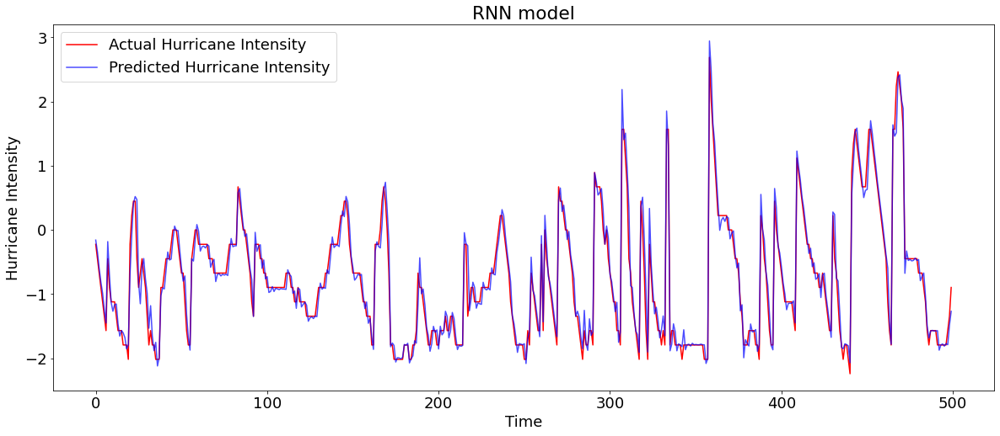

In [201]:
# build RNN model
rnn_model=rnn(X_train,y_train)
rnn_predictions = get_result(rnn_model, X_test, y_test, "RNN")
plot_predictions(y_test, rnn_predictions, yLabel, realLabel, predictedLabel, "RNN model", xLabel="Time"   )


Model: "sequential_39"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_8 (Conv1D)           (None, 22, 64)            192       
                                                                 
 max_pooling1d_8 (MaxPooling  (None, 11, 64)           0         
 1D)                                                             
                                                                 
 flatten_12 (Flatten)        (None, 704)               0         
                                                                 
 dense_43 (Dense)            (None, 10)                7050      
                                                                 
 dense_44 (Dense)            (None, 1)                 11        
                                                                 
Total params: 7,253
Trainable params: 7,253
Non-trainable params: 0
___________________________________________________

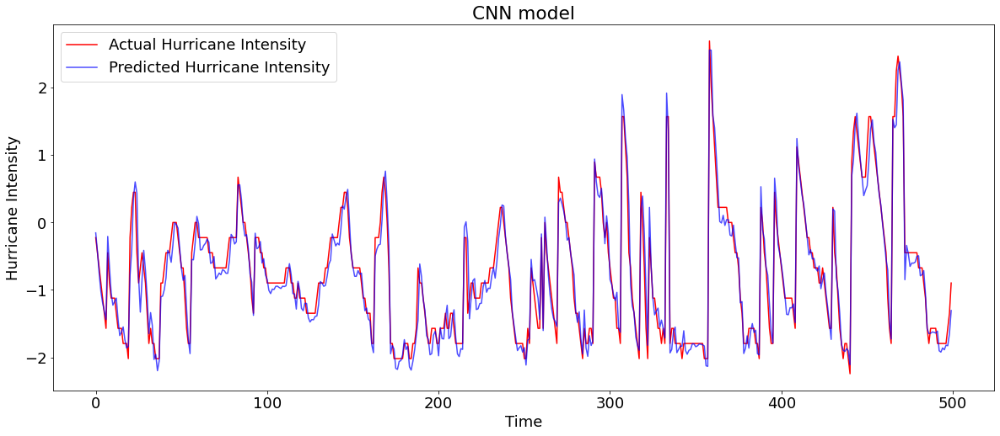

In [202]:
# build CNN model
cnn_model=cnn(X_train,y_train)
cnn_predictions = get_result(cnn_model, X_test, y_test, "CNN")
plot_predictions(y_test, cnn_predictions, yLabel, realLabel, predictedLabel, "CNN model", xLabel="Time" )

Model: "sequential_40"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed_12 (TimeDi  (None, None, 23, 64)     128       
 stributed)                                                      
                                                                 
 time_distributed_13 (TimeDi  (None, None, 11, 64)     0         
 stributed)                                                      
                                                                 
 time_distributed_14 (TimeDi  (None, None, 704)        0         
 stributed)                                                      
                                                                 
 lstm_36 (LSTM)              (None, 20)                58000     
                                                                 
 dense_45 (Dense)            (None, 1)                 21        
                                                     

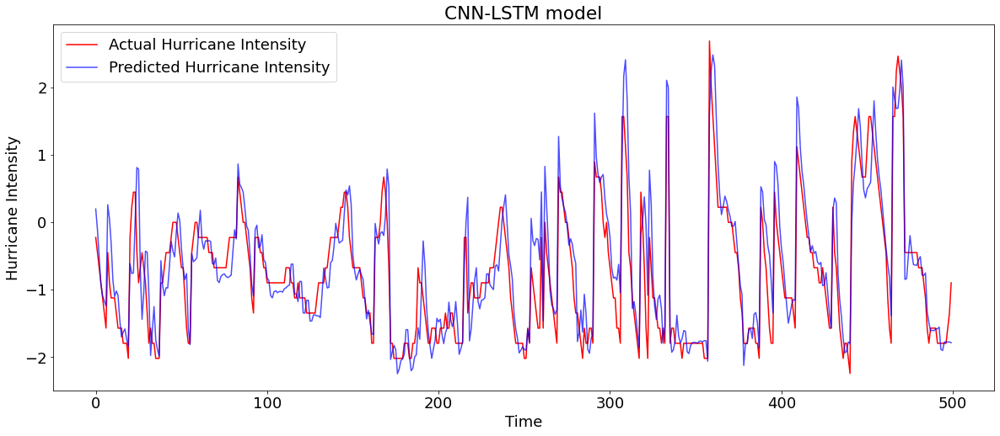

In [203]:
# build CNN-LSTM model
n_seq=1
cnn_lstm_model=cnn_lstm(X_train,y_train)
cnn_lstm_predictions = get_result(cnn_lstm_model, X_test.reshape((X_test.shape[0], n_seq, X_test.shape[1], 1)), y_test, "CNN-LSTM")
plot_predictions(y_test, cnn_lstm_predictions, yLabel, realLabel, predictedLabel, "CNN-LSTM model", xLabel="Time",  )


Model: "sequential_41"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_4 (ConvLSTM2D)  (None, 1, 22, 64)         33536     
                                                                 
 flatten_14 (Flatten)        (None, 1408)              0         
                                                                 
 dense_46 (Dense)            (None, 1)                 1409      
                                                                 
Total params: 34,945
Trainable params: 34,945
Non-trainable params: 0
_________________________________________________________________
Epoch 1/30
100/100 [==============================] - 2s 7ms/step - loss: 0.5618
Epoch 2/30
100/100 [==============================] - 1s 8ms/step - loss: 0.1995
Epoch 3/30
100/100 [==============================] - 1s 5ms/step - loss: 0.1246
Epoch 4/30
100/100 [==============================] - 1s 5ms/step - lo

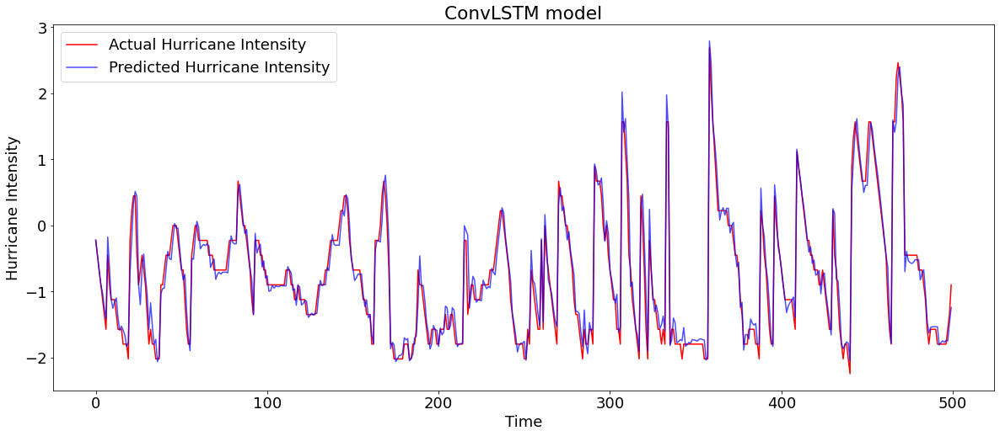

In [204]:
# build ConvLSTM model
n_seq=1
n_features = 1
conv_lstm_model=convlstm(X_train,y_train)

conv_lstm_predictions = get_result(conv_lstm_model, X_test.reshape((X_test.shape[0], n_seq, 1, X_test.shape[1], n_features)), y_test, "ConvLSTM")
plot_predictions(y_test, conv_lstm_predictions, yLabel, realLabel, predictedLabel, "ConvLSTM model", xLabel="Time"   )


# Adversarial Attacks

## Attack Functions

In [205]:
def signed_gradient(X_test, y): 
    X_tf = tf.convert_to_tensor(X_test, dtype=tf.float32)
    with tf.GradientTape() as tape:
        tape.watch(X_tf)
        lossFunction = mean_squared_error(X_tf, y.reshape(-1))
    gradientFunction = tape.gradient(lossFunction, X_tf)
    signed_grad = tf.sign(gradientFunction)
    return signed_grad.numpy()

def fgsm(X_test, y, epsilon=0.1):
    signed_grad = signed_gradient(X_test, y)
    X_perturbed = X_test + epsilon * signed_grad
    return X_perturbed

def bim(iterations, epsilon, alpha, X_test, y, final_X_only = True):
    X_perturbed = X_test.copy()
    for i in range(iterations):
        n = alpha * signed_gradient(X_perturbed, y)
        X_perturbed += n
        maxValues = np.maximum((X_test-epsilon), np.array(X_perturbed)) 
        X_perturbed = np.minimum((X_test+epsilon), maxValues)
       
        return X_perturbed
def pgd(iterations, epsilon, alpha, X_test, y, final_X_only = True):
    X_perturbed = X_test + np.random.uniform(-epsilon,epsilon,X_test.shape)
    for i in range(iterations):
        n = alpha * signed_gradient(X_perturbed, y)
        X_perturbed += n
        maxValues = np.maximum((X_test-epsilon), np.array(X_perturbed)) 
        X_perturbed = np.minimum((X_test+epsilon), maxValues)
        
        
        return X_perturbed

## Attacks on Models

In [206]:
epsilon = 0.3
alpha = 0.25

### Attacks on LSTM

Model - FGSM perturbed LSTM:
R^2 Score: 0.8929195873423716
RMSE: 0.30343588489766576


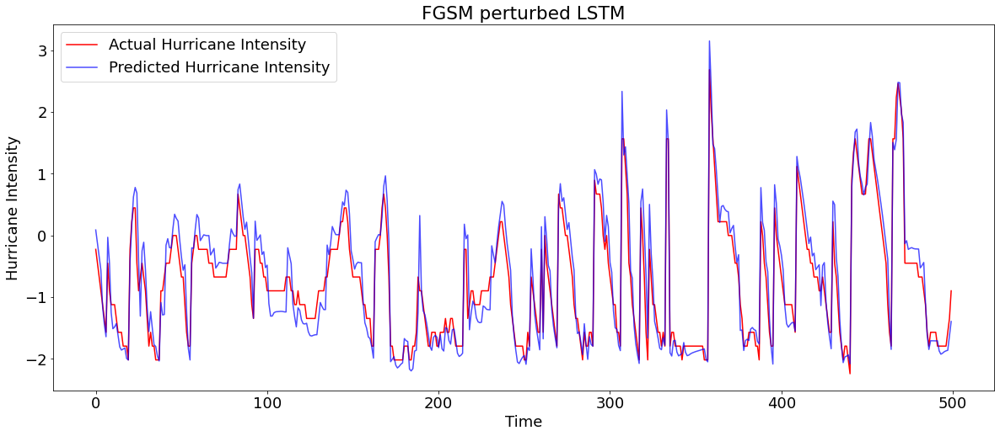

In [207]:
X_fgsm_perturbed_lstm = fgsm(X_test, y_test, epsilon) 
fgsm_predictions_lstm = get_result(lstm_model, X_fgsm_perturbed_lstm, y_test, "FGSM perturbed LSTM")
plot_predictions(y_test, fgsm_predictions_lstm, yLabel, realLabel, predictedLabel, "FGSM perturbed LSTM", xLabel="Time")

In [208]:
# run this to show intermediate results
# bim(lstm_model, 5, 0.1, 0.05, X_test, y_test, final_X_only = False)

Model - BIM perturbed LSTM:
R^2 Score: 0.9132989083261502
RMSE: 0.2730386959264371


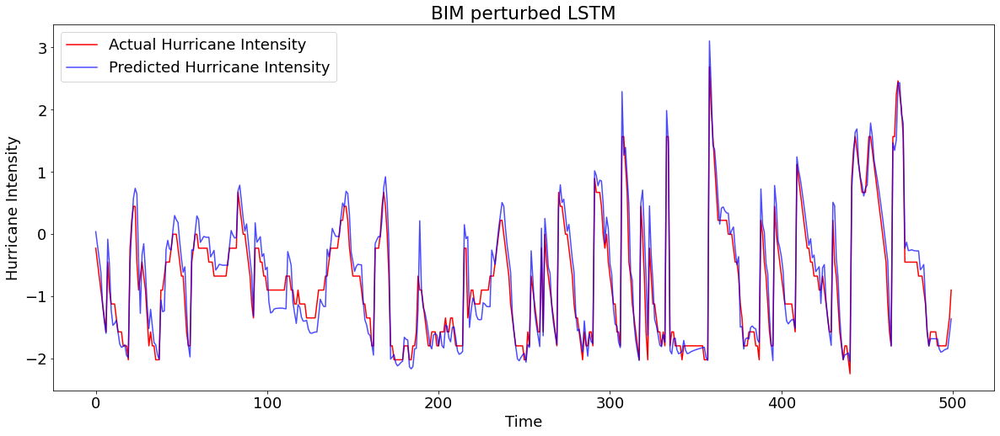

In [209]:
X_bim_perturbed_lstm = bim(5, epsilon, alpha, X_test, y_test)
bim_predictions_lstm = get_result(lstm_model, X_bim_perturbed_lstm, y_test, "BIM perturbed LSTM")
plot_predictions(y_test, bim_predictions_lstm, yLabel, realLabel, predictedLabel, "BIM perturbed LSTM", xLabel="Time")

In [210]:
# run this to show intermediate results
# pgd(lstm_model, 5, 0.1, 0.05, X_test, y_test, final_X_only =False)

Model - PGD perturbed LSTM:
R^2 Score: 0.9075153142559216
RMSE: 0.28199851250256186


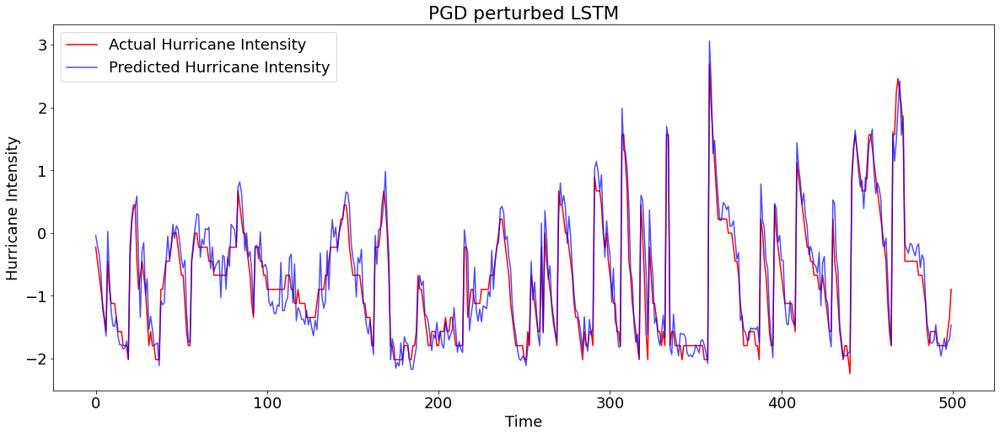

In [211]:
X_pgd_perturbed_lstm = pgd(5, epsilon, alpha, X_test, y_test)
pgd_predictions_lstm = get_result(lstm_model, X_pgd_perturbed_lstm, y_test, "PGD perturbed LSTM")
plot_predictions(y_test, pgd_predictions_lstm, yLabel, realLabel, predictedLabel, "PGD perturbed LSTM", xLabel="Time")

### Attacks on Stacked LSTM

Model - FGSM perturbed Stacked LSTM:
R^2 Score: 0.8798627140146399
RMSE: 0.3214036684947919


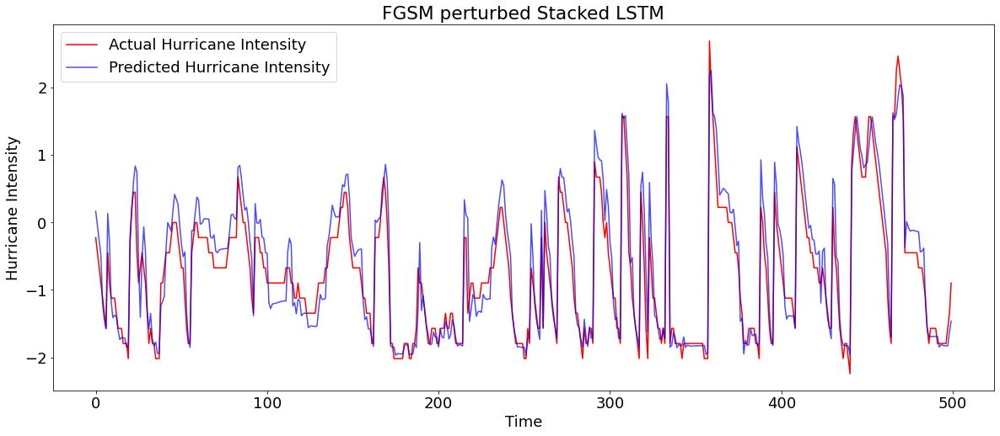

In [212]:
X_fgsm_perturbed_stlstm = fgsm(X_test, y_test, epsilon) 
fgsm_predictions_stlstm = get_result(s_lstm_model, X_fgsm_perturbed_stlstm, y_test, "FGSM perturbed Stacked LSTM")
plot_predictions(y_test, fgsm_predictions_stlstm, yLabel, realLabel, predictedLabel,  "FGSM perturbed Stacked LSTM", xLabel="Time")

Model - BIM perturbed Stacked LSTM:
R^2 Score: 0.9004553534057611
RMSE: 0.2925639725892335


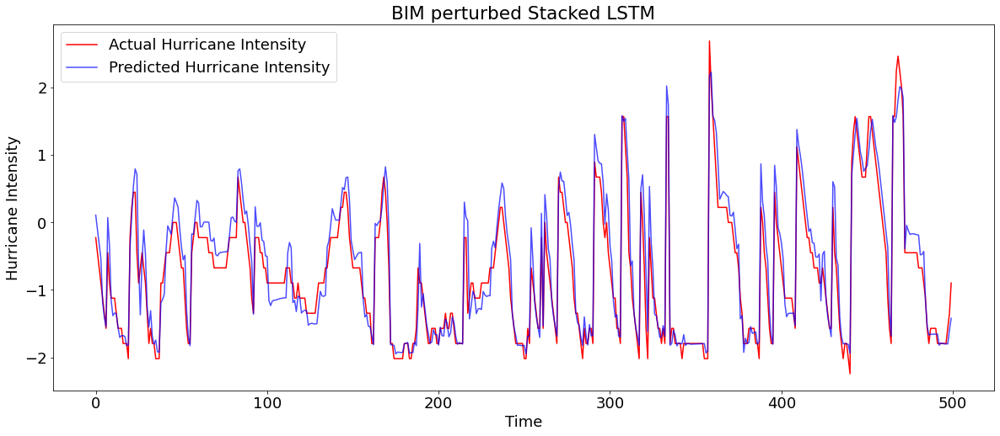

In [213]:

X_bim_perturbed_stlstm = bim(5, epsilon, alpha, X_test, y_test)
bim_predictions_stlstm = get_result(s_lstm_model, X_bim_perturbed_stlstm, y_test, "BIM perturbed Stacked LSTM")
plot_predictions(y_test, bim_predictions_stlstm, yLabel, realLabel, predictedLabel, "BIM perturbed Stacked LSTM", xLabel="Time",)


Model - PGD perturbed Stacked LSTM:
R^2 Score: 0.9023005802268282
RMSE: 0.28983971780609646


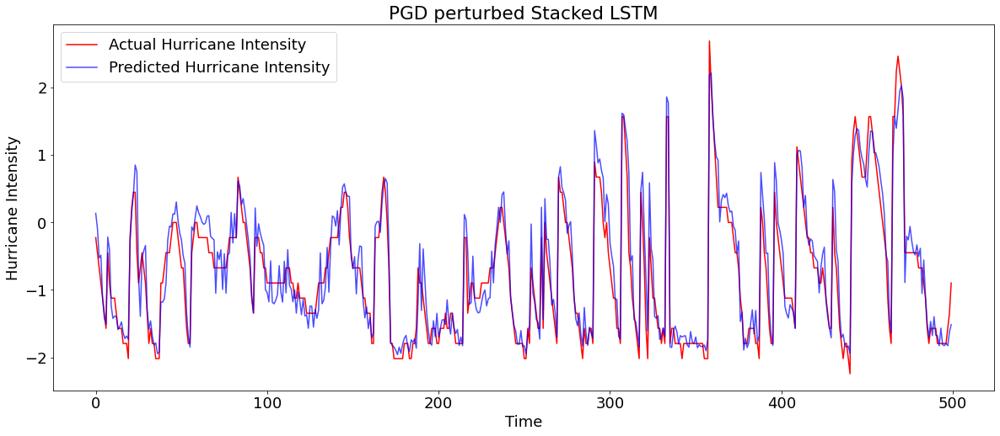

In [214]:
X_pgd_perturbed_stlstm = pgd(5, epsilon, alpha, X_test, y_test)
pgd_predictions_stlstm = get_result(s_lstm_model, X_pgd_perturbed_stlstm, y_test, "PGD perturbed Stacked LSTM")
plot_predictions(y_test, pgd_predictions_stlstm, yLabel, realLabel, predictedLabel, "PGD perturbed Stacked LSTM", xLabel="Time" )

### Attacks on GRU

Model - FGSM perturbed GRU:
R^2 Score: 0.8208012530149404
RMSE: 0.3925359523003503


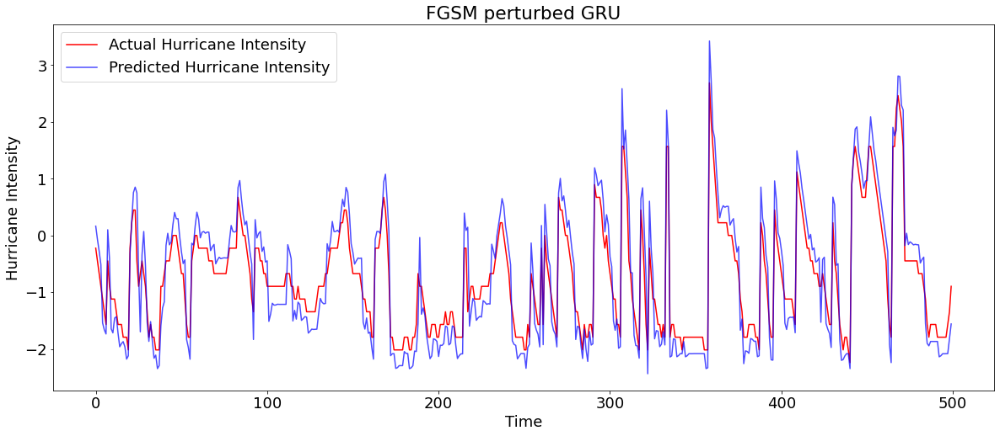

In [215]:
# need to copy the same things above
# replace the variable names carefully
X_fgsm_perturbed_gru = fgsm(X_test, y_test, epsilon) 
fgsm_predictions_gru = get_result(gru_model, X_fgsm_perturbed_gru, y_test, "FGSM perturbed GRU")
plot_predictions(y_test, fgsm_predictions_gru, yLabel, realLabel, predictedLabel, "FGSM perturbed GRU", xLabel="Time" )

Model - BIM perturbed GRU:
R^2 Score: 0.8601467969433821
RMSE: 0.3467752996420444


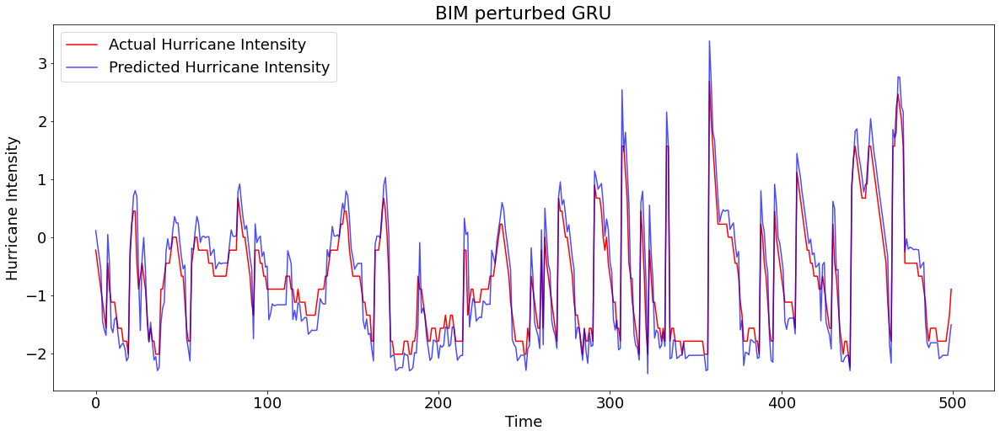

In [216]:

X_bim_perturbed_gru = bim(5, epsilon, alpha, X_test, y_test)
bim_predictions_gru = get_result(gru_model, X_bim_perturbed_gru, y_test, "BIM perturbed GRU")
plot_predictions(y_test, bim_predictions_gru, yLabel, realLabel, predictedLabel, "BIM perturbed GRU", xLabel="Time" )


Model - PGD perturbed GRU:
R^2 Score: 0.8523015514156109
RMSE: 0.3563689685740647


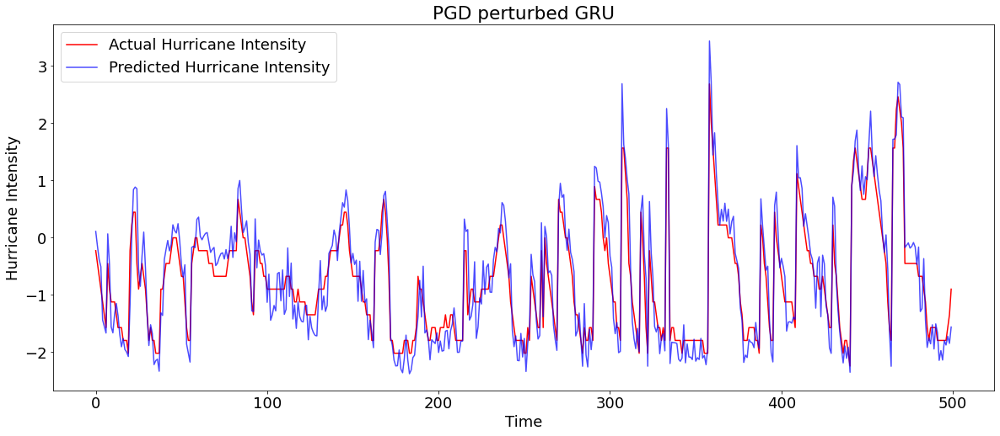

In [217]:
X_pgd_perturbed_gru = pgd(5, epsilon, alpha, X_test, y_test)
pgd_predictions_gru = get_result(gru_model, X_pgd_perturbed_gru, y_test, "PGD perturbed GRU")
plot_predictions(y_test, pgd_predictions_gru, yLabel, realLabel, predictedLabel, "PGD perturbed GRU", xLabel="Time" )

### Attacks on RNN

In [218]:
# need to copy the same things above
# replace the variable names carefully

Model - FGSM perturbed RNN:
R^2 Score: 0.8303395076818495
RMSE: 0.3819462843571283


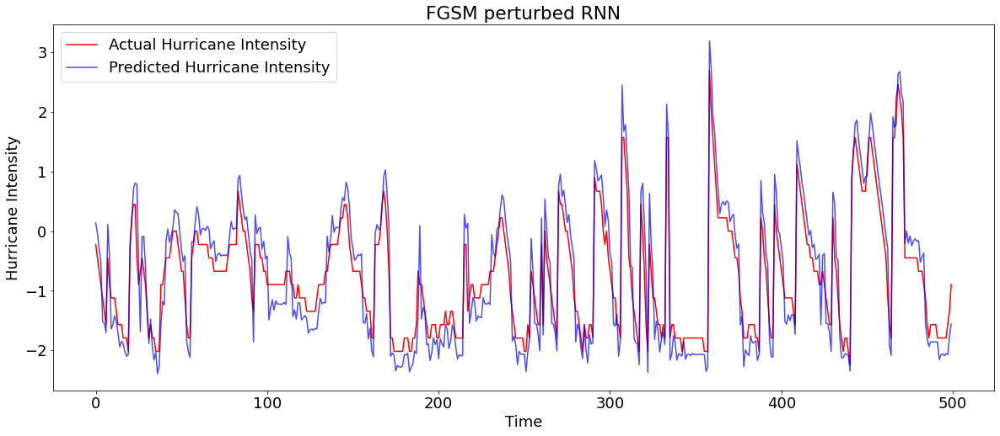

In [219]:
X_fgsm_perturbed_rnn = fgsm(X_test, y_test, epsilon ) 
fgsm_predictions_rnn = get_result(rnn_model, X_fgsm_perturbed_rnn, y_test, "FGSM perturbed RNN")
plot_predictions(y_test, fgsm_predictions_rnn, yLabel, realLabel, predictedLabel, "FGSM perturbed RNN", xLabel="Time" )

Model - BIM perturbed RNN:
R^2 Score: 0.8671657182374349
RMSE: 0.33796133282794244


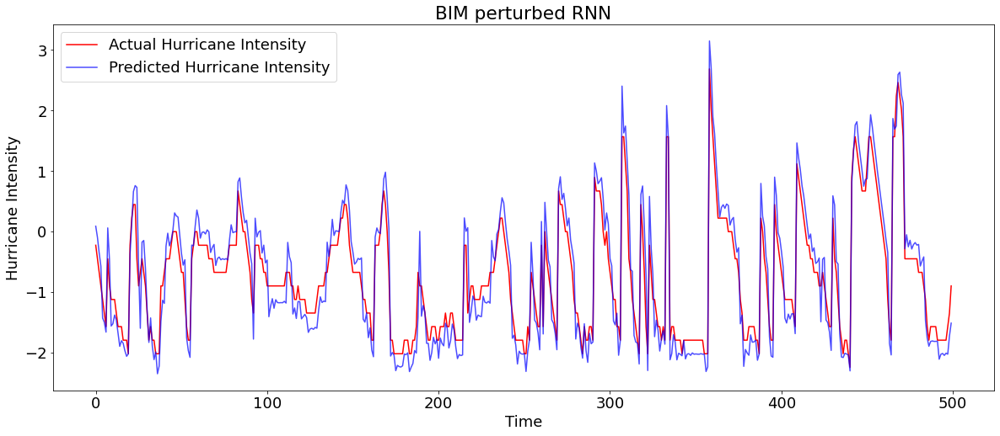

In [220]:
X_bim_perturbed_rnn = bim(5, epsilon, alpha, X_test, y_test)
bim_predictions_rnn = get_result(rnn_model, X_bim_perturbed_rnn, y_test, "BIM perturbed RNN")
plot_predictions(y_test, bim_predictions_rnn, yLabel, realLabel, predictedLabel, "BIM perturbed RNN", xLabel="Time" )


Model - PGD perturbed RNN:
R^2 Score: 0.8549611222252916
RMSE: 0.3531458907573012


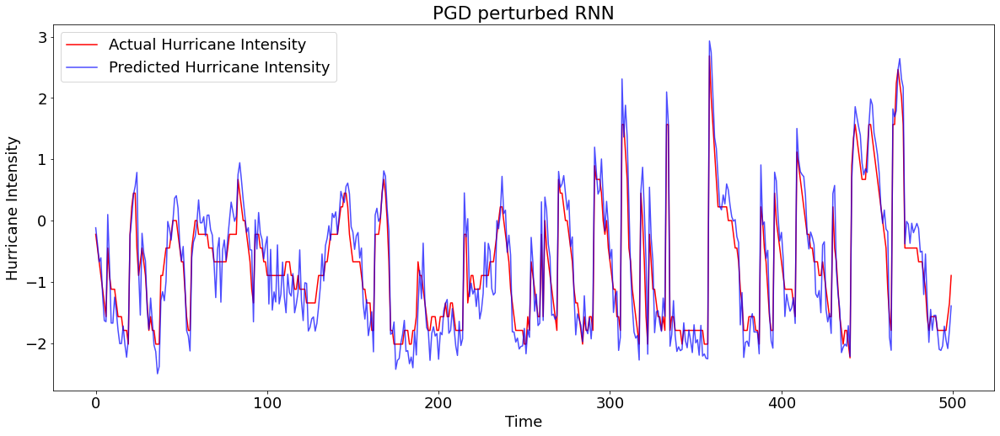

In [221]:
X_pgd_perturbed_rnn = pgd(5, epsilon, alpha, X_test, y_test)
pgd_predictions_rnn = get_result(rnn_model, X_pgd_perturbed_rnn, y_test, "PGD perturbed RNN")
plot_predictions(y_test, pgd_predictions_rnn, yLabel, realLabel, predictedLabel, "PGD perturbed RNN", xLabel="Time" )

### Attacks on CNN

In [222]:
# need to copy the same things above
# replace the variable names carefully

Model - FGSM perturbed CNN:
R^2 Score: 0.8217329456327724
RMSE: 0.39151416669014427


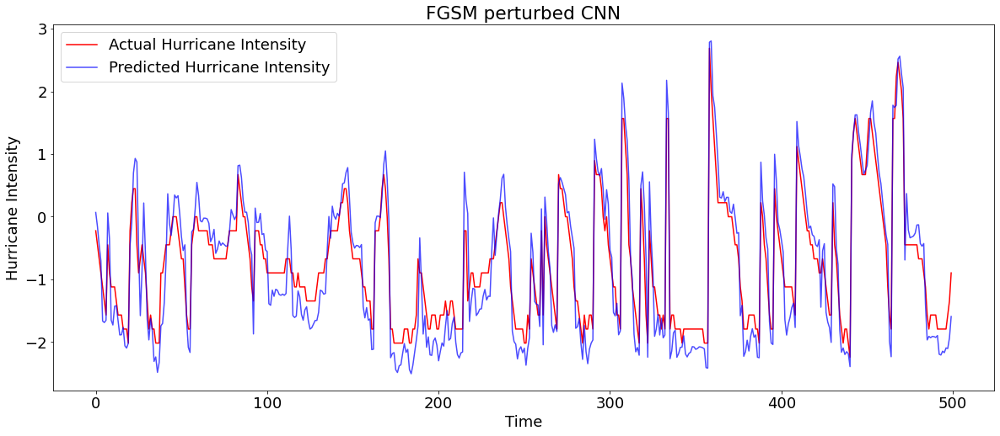

In [223]:
X_fgsm_perturbed_cnn = fgsm(X_test, y_test, epsilon ) 
fgsm_predictions_cnn = get_result(cnn_model, X_fgsm_perturbed_cnn, y_test, "FGSM perturbed CNN")
plot_predictions(y_test, fgsm_predictions_cnn, yLabel, realLabel, predictedLabel, "FGSM perturbed CNN", xLabel="Time" )

Model - BIM perturbed CNN:
R^2 Score: 0.8597504767275919
RMSE: 0.34726629997333713


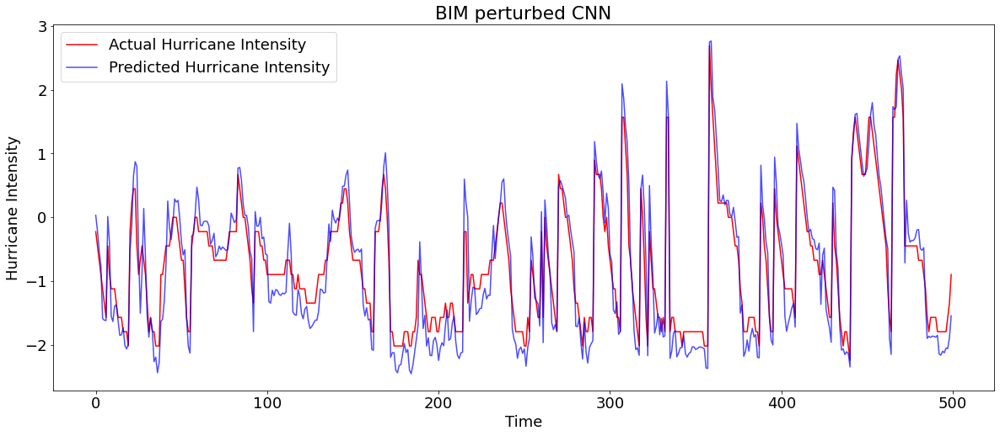

In [224]:
X_bim_perturbed_cnn = bim(5, epsilon, alpha, X_test, y_test)
bim_predictions_cnn = get_result(cnn_model, X_bim_perturbed_cnn, y_test, "BIM perturbed CNN")
plot_predictions(y_test, bim_predictions_cnn, yLabel, realLabel, predictedLabel, "BIM perturbed CNN", xLabel="Time" )


Model - PGD perturbed CNN:
R^2 Score: 0.8458826850918483
RMSE: 0.3640303937319184


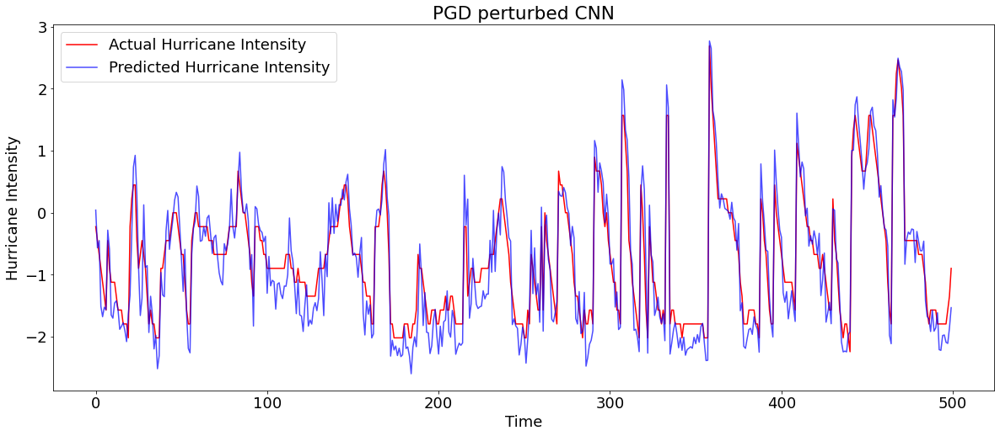

In [225]:
X_pgd_perturbed_cnn = pgd(5, epsilon, alpha,X_test, y_test)
pgd_predictions_cnn = get_result(cnn_model, X_pgd_perturbed_cnn, y_test, "PGD perturbed CNN")
plot_predictions(y_test, pgd_predictions_cnn, yLabel, realLabel, predictedLabel, "PGD perturbed CNN", xLabel="Time")

### Attacks on CNN-LSTM

Model - CNN-LSTM:
R^2 Score: 0.5813840784784963
RMSE: 0.5999565734644956


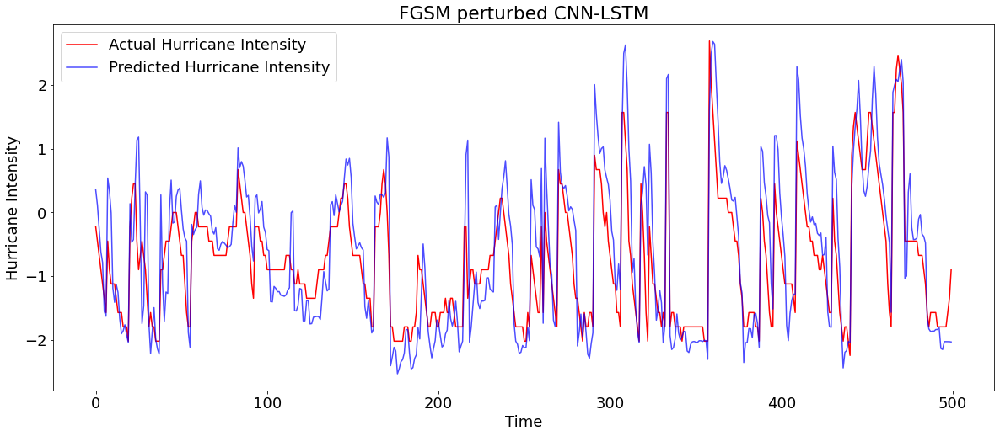

In [226]:
X_fgsm_perturbed_cnnlstm = fgsm(X_test, y_test, epsilon ) 
fgsm_predictions_cnnlstm = get_result(cnn_lstm_model, X_fgsm_perturbed_cnnlstm.reshape((X_fgsm_perturbed_cnnlstm.shape[0], n_seq, X_fgsm_perturbed_cnnlstm.shape[1], 1)), y_test, "CNN-LSTM")
plot_predictions(y_test, fgsm_predictions_cnnlstm, yLabel, realLabel, predictedLabel, "FGSM perturbed CNN-LSTM", xLabel="Time")

Model - BIM CNN-LSTM:
R^2 Score: 0.6300015164966739
RMSE: 0.5640425987642679


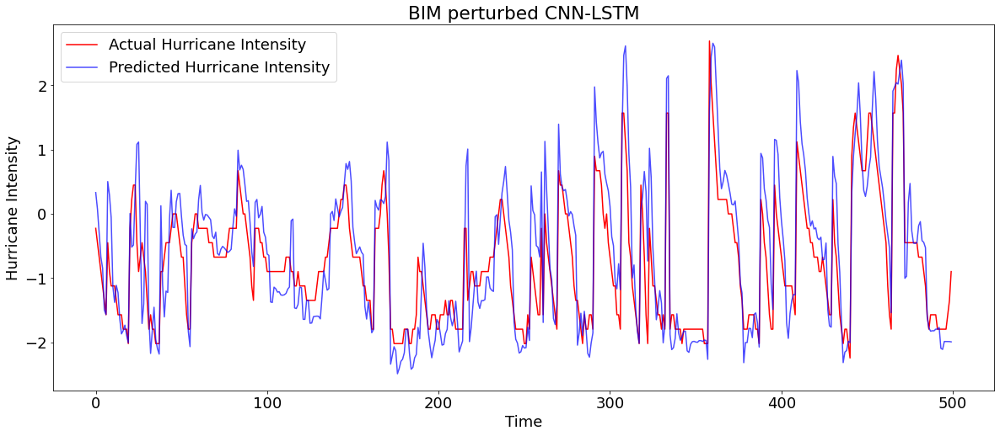

In [227]:
X_bim_perturbed_cnnlstm = bim(5, epsilon, alpha,X_test, y_test) 
bim_predictions_cnnlstm = get_result(cnn_lstm_model, X_bim_perturbed_cnnlstm.reshape((X_bim_perturbed_cnnlstm.shape[0], n_seq, X_bim_perturbed_cnnlstm.shape[1], 1)), y_test, "BIM CNN-LSTM")
plot_predictions(y_test, bim_predictions_cnnlstm, yLabel, realLabel, predictedLabel, "BIM perturbed CNN-LSTM", xLabel="Time")

Model - PGD CNN-LSTM:
R^2 Score: 0.64502967604087
RMSE: 0.5524690348375606


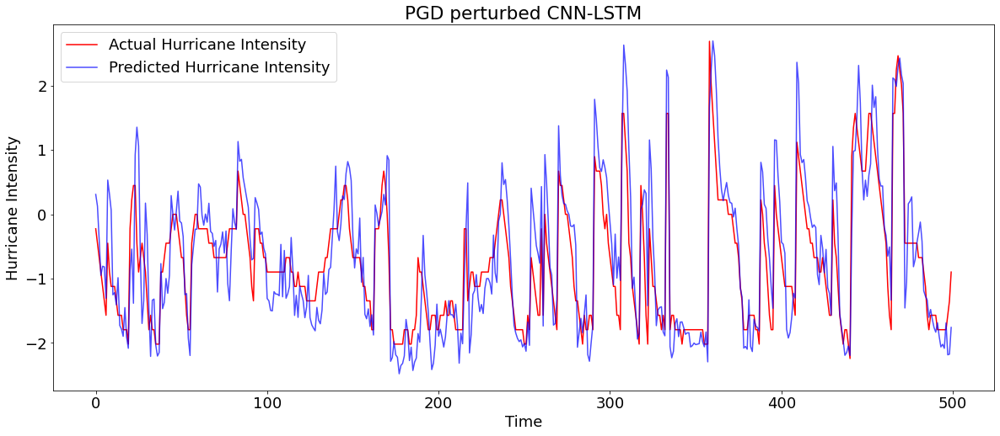

In [228]:
X_pgd_perturbed_cnnlstm = pgd(5,  epsilon, alpha, X_test, y_test) 
pgd_predictions_cnnlstm = get_result(cnn_lstm_model, X_pgd_perturbed_cnnlstm.reshape((X_pgd_perturbed_cnnlstm.shape[0], n_seq, X_pgd_perturbed_cnnlstm.shape[1], 1)), y_test, "PGD CNN-LSTM")
plot_predictions(y_test, pgd_predictions_cnnlstm, yLabel, realLabel, predictedLabel, "PGD perturbed CNN-LSTM", xLabel="Time" )

### Attacks on ConvLSTM

Model - Conv-LSTM:
R^2 Score: 0.8451621871429249
RMSE: 0.3648803137156755


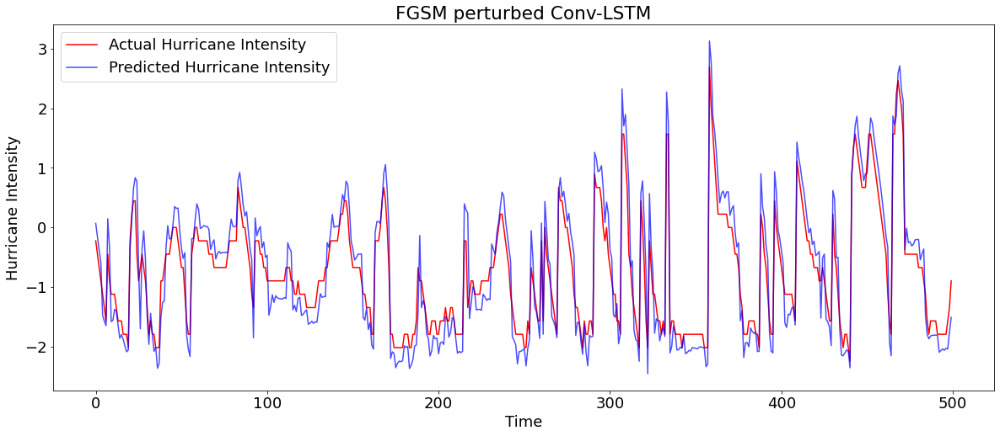

In [229]:
X_fgsm_perturbed_convlstm = fgsm(X_test, y_test, epsilon ) 
fgsm_predictions_convlstm = get_result(conv_lstm_model, X_fgsm_perturbed_convlstm.reshape((X_fgsm_perturbed_convlstm.shape[0], n_seq,1, X_fgsm_perturbed_convlstm.shape[1], 1)), y_test, "Conv-LSTM")
plot_predictions(y_test, fgsm_predictions_convlstm, yLabel, realLabel, predictedLabel,  "FGSM perturbed Conv-LSTM", xLabel="Time" )

Model - BIM ConvLSTM:
R^2 Score: 0.8797679241014281
RMSE: 0.321530457226405


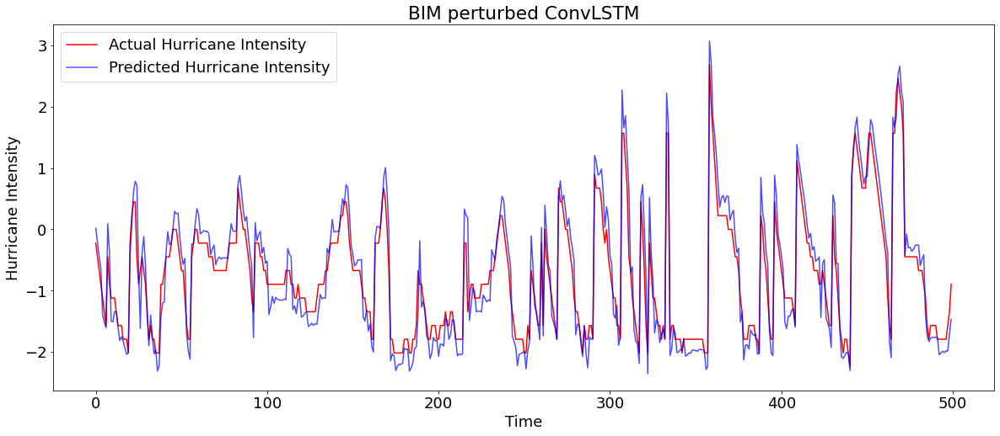

In [230]:
X_bim_perturbed_convlstm = bim(5, epsilon, alpha, X_test, y_test) 
bim_predictions_convlstm = get_result(conv_lstm_model, X_bim_perturbed_convlstm.reshape((X_bim_perturbed_convlstm.shape[0], n_seq,1, X_bim_perturbed_convlstm.shape[1], 1)), y_test, "BIM ConvLSTM")
plot_predictions(y_test, bim_predictions_convlstm, yLabel, realLabel, predictedLabel, "BIM perturbed ConvLSTM", xLabel="Time")

Model - PGD ConvLSTM:
R^2 Score: 0.868057121447702
RMSE: 0.3368254614166087


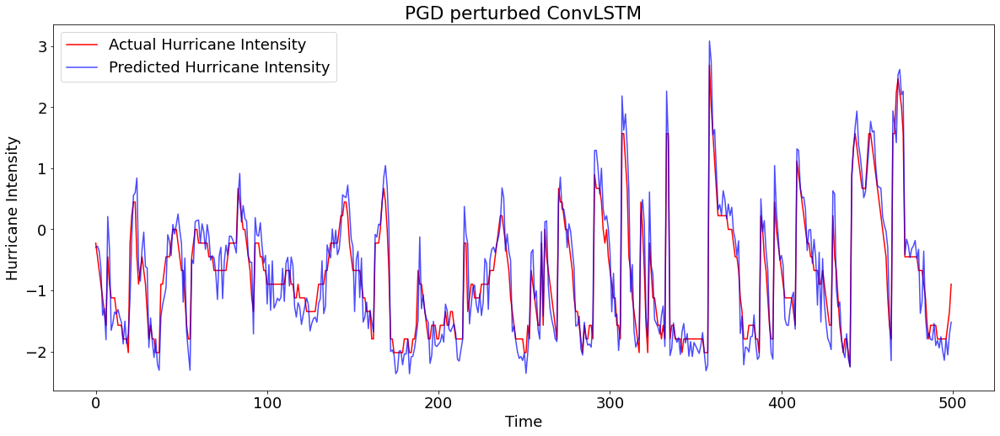

In [231]:
X_pgd_perturbed_convlstm = pgd(5,  epsilon, alpha, X_test, y_test) 
pgd_predictions_convlstm = get_result(conv_lstm_model, X_pgd_perturbed_convlstm.reshape((X_pgd_perturbed_convlstm.shape[0], n_seq,1, X_pgd_perturbed_convlstm.shape[1], 1)), y_test, "PGD ConvLSTM")
plot_predictions(y_test, pgd_predictions_convlstm, yLabel, realLabel, predictedLabel, "PGD perturbed ConvLSTM", xLabel="Time")

## Adversarial Learning

In [261]:
new_Y=np.concatenate((y_train,y_train))

In [262]:
# Create perturbed training set
X_fgsm_perturbed_train = fgsm(X_train, y_train, epsilon)
X_new_fgsm=np.concatenate((X_train,X_fgsm_perturbed_train))
fgsm_lstm=lstm(X_new_fgsm,new_Y)

Model: "sequential_52"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_49 (LSTM)              (None, 50)                10400     
                                                                 
 dropout_59 (Dropout)        (None, 50)                0         
                                                                 
 dense_57 (Dense)            (None, 1)                 51        
                                                                 
Total params: 10,451
Trainable params: 10,451
Non-trainable params: 0
_________________________________________________________________
Epoch 1/30
200/200 [==============================] - 2s 7ms/step - loss: 0.2589
Epoch 2/30
200/200 [==============================] - 2s 8ms/step - loss: 0.1400
Epoch 3/30
200/200 [==============================] - 2s 8ms/step - loss: 0.1169
Epoch 4/30
200/200 [==============================] - 2s 9ms/step - lo

Model - FGSM-LSTM:
R^2 Score: 0.941386853060782
RMSE: 0.22449642326749097


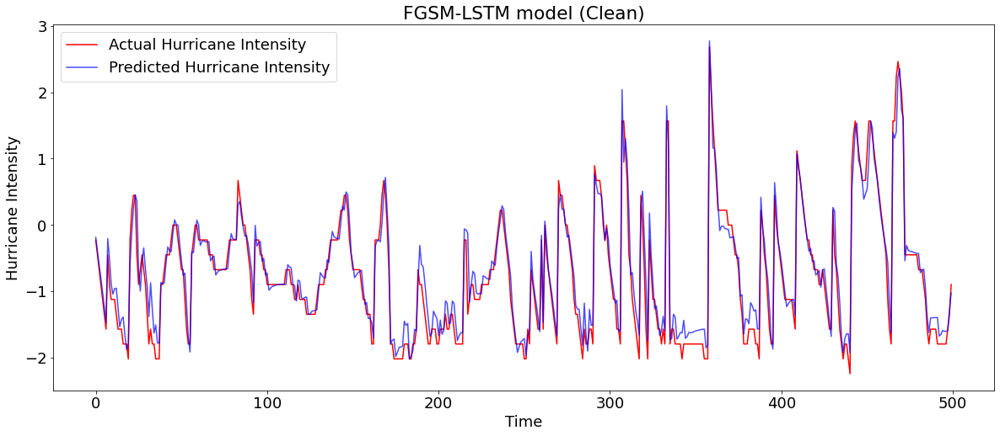

In [263]:
lstm_fgsm_predictions=get_result(fgsm_lstm, X_test, y_test, "FGSM-LSTM")
plot_predictions(y_test, lstm_fgsm_predictions, yLabel, realLabel, predictedLabel, "FGSM-LSTM model (Clean)", xLabel="Time" )

Model - FGSM-LSTM:
R^2 Score: 0.8998199728747516
RMSE: 0.29349619116984293


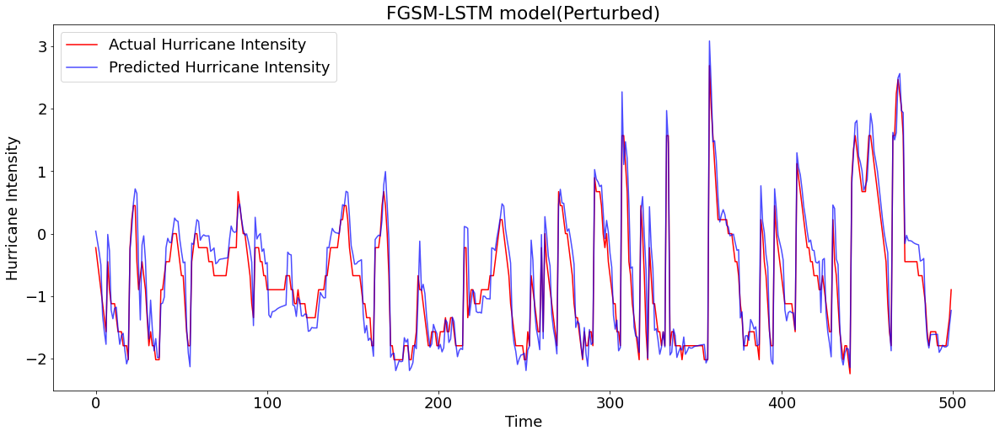

In [264]:
lstm_fgsm_predictions=get_result(fgsm_lstm, X_fgsm_perturbed_lstm, y_test, "FGSM-LSTM")
plot_predictions(y_test, lstm_fgsm_predictions, yLabel, realLabel, predictedLabel, "FGSM-LSTM model(Perturbed)", xLabel="Time" )

In [265]:
# Create perturbed training set
X_bim_perturbed_train = bim(5,epsilon, alpha,X_train, y_train)
X_new_bim=np.concatenate((X_train,X_bim_perturbed_train))
bim_lstm=lstm(X_new_bim,new_Y)


Model: "sequential_53"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_50 (LSTM)              (None, 50)                10400     
                                                                 
 dropout_60 (Dropout)        (None, 50)                0         
                                                                 
 dense_58 (Dense)            (None, 1)                 51        
                                                                 
Total params: 10,451
Trainable params: 10,451
Non-trainable params: 0
_________________________________________________________________
Epoch 1/30
200/200 [==============================] - 2s 8ms/step - loss: 0.3855
Epoch 2/30
200/200 [==============================] - 2s 8ms/step - loss: 0.1862
Epoch 3/30
200/200 [==============================] - 1s 7ms/step - loss: 0.1416
Epoch 4/30
200/200 [==============================] - 1s 6ms/step - lo

Model - BIM-LSTM:
R^2 Score: 0.9402927913289392
RMSE: 0.2265819343913269


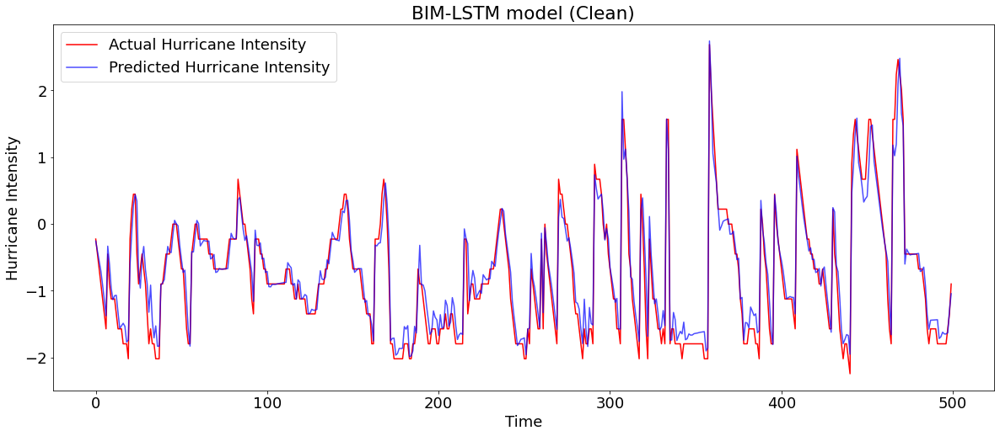

In [266]:

lstm_bim_predictions=get_result(bim_lstm, X_test, y_test, "BIM-LSTM")
plot_predictions(y_test, lstm_bim_predictions, yLabel, realLabel, predictedLabel, "BIM-LSTM model (Clean)", xLabel="Time" )

Model - BIM-LSTM:
R^2 Score: 0.9236494715302789
RMSE: 0.25622291072850095


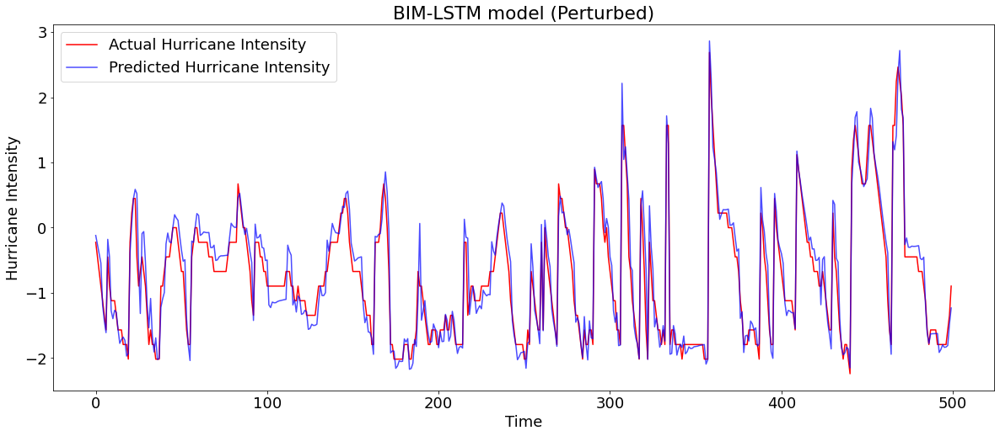

In [267]:

lstm_bim_predictions=get_result(bim_lstm, X_bim_perturbed_lstm, y_test, "BIM-LSTM")
plot_predictions(y_test, lstm_bim_predictions, yLabel, realLabel, predictedLabel, "BIM-LSTM model (Perturbed)", xLabel="Time" )


In [268]:
# Create perturbed training set
X_pgd_perturbed_train = pgd(5,epsilon, alpha,X_train, y_train)
X_new_pgd=np.concatenate((X_train,X_pgd_perturbed_train))
pgd_lstm=lstm(X_new_pgd,new_Y)

Model: "sequential_54"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_51 (LSTM)              (None, 50)                10400     
                                                                 
 dropout_61 (Dropout)        (None, 50)                0         
                                                                 
 dense_59 (Dense)            (None, 1)                 51        
                                                                 
Total params: 10,451
Trainable params: 10,451
Non-trainable params: 0
_________________________________________________________________
Epoch 1/30
200/200 [==============================] - 3s 10ms/step - loss: 0.2734
Epoch 2/30
200/200 [==============================] - 2s 9ms/step - loss: 0.1277
Epoch 3/30
200/200 [==============================] - 2s 7ms/step - loss: 0.1058
Epoch 4/30
200/200 [==============================] - 2s 8ms/step - l

Model - PGD-LSTM:
R^2 Score: 0.9476500550508793
RMSE: 0.2121631898282977


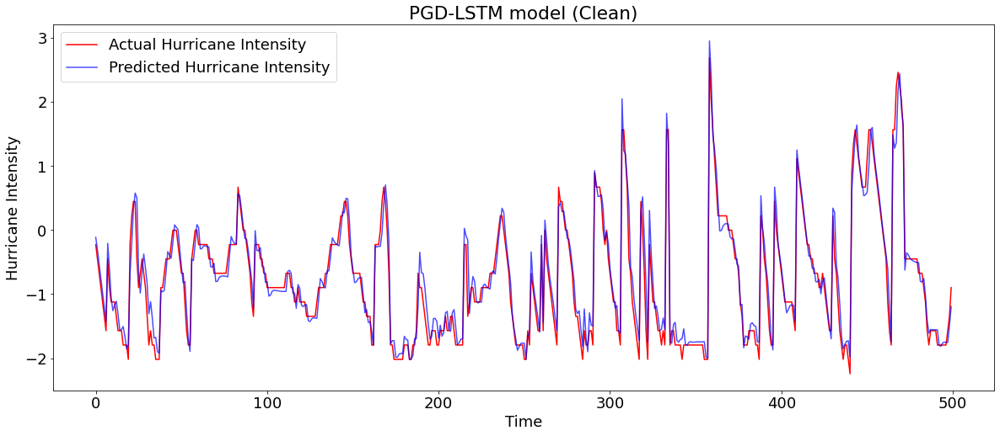

In [269]:
lstm_pgd_predictions=get_result(pgd_lstm, X_test, y_test, "PGD-LSTM")
plot_predictions(y_test, lstm_pgd_predictions, yLabel, realLabel, predictedLabel, "PGD-LSTM model (Clean)", xLabel="Time" )

Model - PGS-LSTM:
R^2 Score: 0.8951924309174352
RMSE: 0.30019832453212514


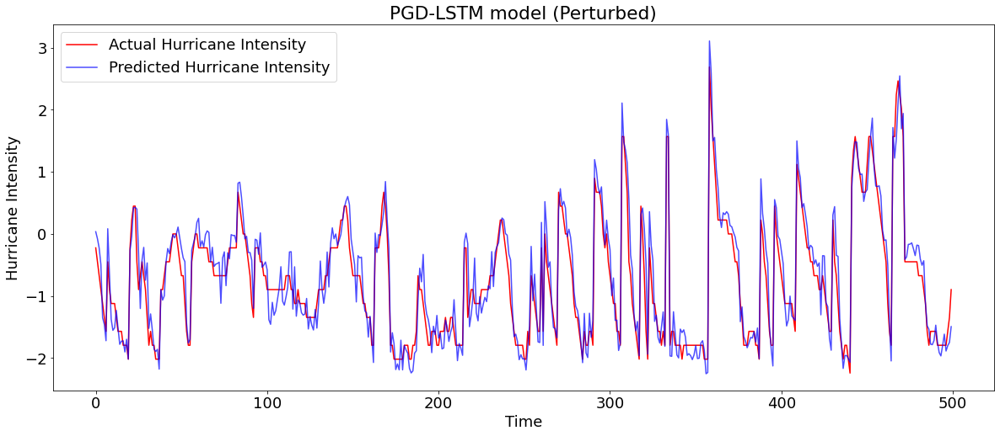

In [270]:
lstm_pgd_predictions=get_result(pgd_lstm, X_pgd_perturbed_lstm, y_test, "PGS-LSTM")
plot_predictions(y_test, lstm_pgd_predictions, yLabel, realLabel, predictedLabel, "PGD-LSTM model (Perturbed)", xLabel="Time" )

#### Stacked LSTM

In [271]:
# Create perturbed training set
X_fgsm_perturbed_train = fgsm(X_train, y_train, epsilon)
X_new_fgsm=np.concatenate((X_train,X_fgsm_perturbed_train))
fgsm_stlstm=stacked_lstm(X_new_fgsm,new_Y)

Model: "sequential_55"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_52 (LSTM)              (None, 23, 50)            10400     
                                                                 
 dropout_62 (Dropout)        (None, 23, 50)            0         
                                                                 
 lstm_53 (LSTM)              (None, 23, 30)            9720      
                                                                 
 dropout_63 (Dropout)        (None, 23, 30)            0         
                                                                 
 lstm_54 (LSTM)              (None, 10)                1640      
                                                                 
 dropout_64 (Dropout)        (None, 10)                0         
                                                                 
 dense_60 (Dense)            (None, 1)               

Model - FGSM-StackedLSTM:
R^2 Score: 0.919643986944004
RMSE: 0.2628579327688247


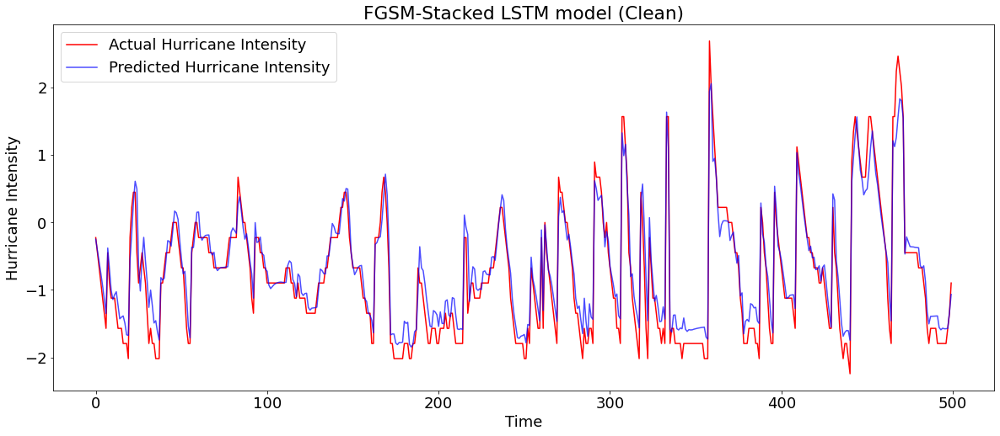

In [272]:
stlstm_fgsm_predictions=get_result(fgsm_stlstm, X_test, y_test, "FGSM-StackedLSTM")
plot_predictions(y_test, stlstm_fgsm_predictions, yLabel, realLabel, predictedLabel, "FGSM-Stacked LSTM model (Clean)", xLabel="Time" )

Model - FGSM-StackedLSTM:
R^2 Score: 0.9083259395912238
RMSE: 0.2807599540323276


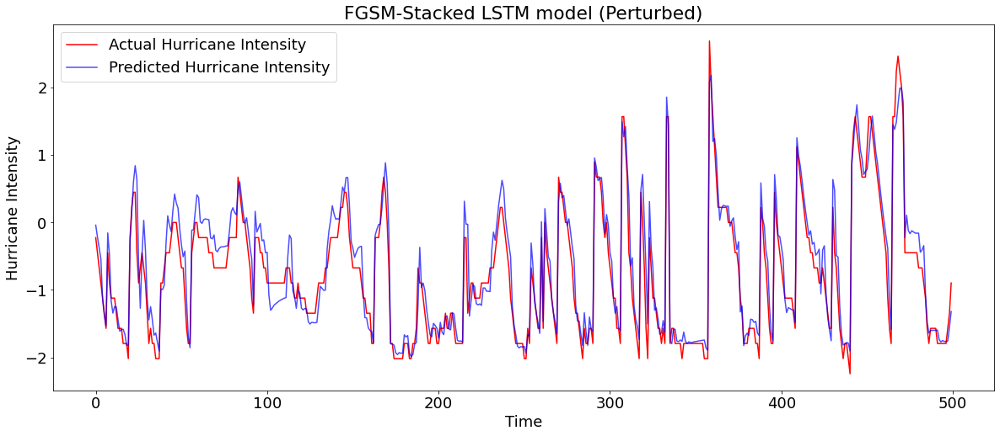

In [273]:
stlstm_fgsm_predictions=get_result(fgsm_stlstm, X_fgsm_perturbed_stlstm, y_test, "FGSM-StackedLSTM")
plot_predictions(y_test, stlstm_fgsm_predictions, yLabel, realLabel, predictedLabel, "FGSM-Stacked LSTM model (Perturbed)", xLabel="Time" )

In [274]:
# Create perturbed training set
X_bim_perturbed_train = bim(5,epsilon, alpha,X_train, y_train)
X_new_bim=np.concatenate((X_train,X_bim_perturbed_train))
bim_stlstm=stacked_lstm(X_new_bim,new_Y)

Model: "sequential_56"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_55 (LSTM)              (None, 23, 50)            10400     
                                                                 
 dropout_65 (Dropout)        (None, 23, 50)            0         
                                                                 
 lstm_56 (LSTM)              (None, 23, 30)            9720      
                                                                 
 dropout_66 (Dropout)        (None, 23, 30)            0         
                                                                 
 lstm_57 (LSTM)              (None, 10)                1640      
                                                                 
 dropout_67 (Dropout)        (None, 10)                0         
                                                                 
 dense_61 (Dense)            (None, 1)               

Model - BIM-StackedLSTM:
R^2 Score: 0.9164523532855755
RMSE: 0.26802728363994904


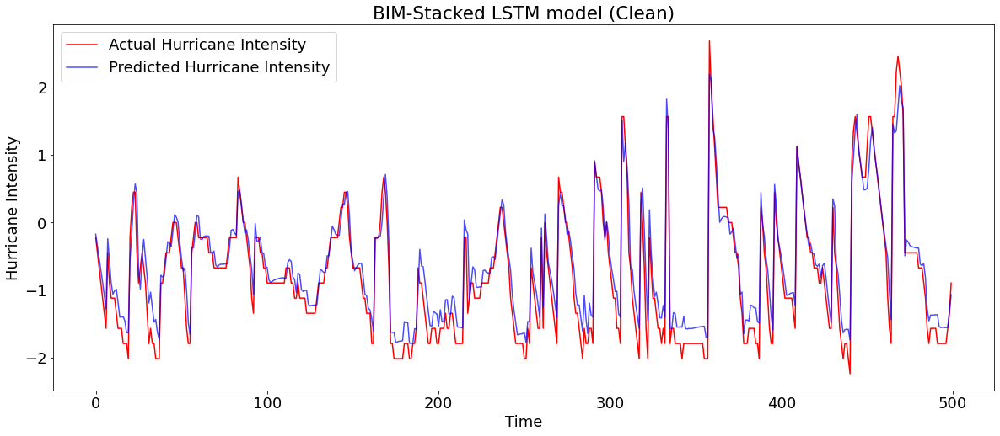

In [275]:

stlstm_bim_predictions=get_result(bim_stlstm, X_test, y_test, "BIM-StackedLSTM")
plot_predictions(y_test, stlstm_bim_predictions, yLabel, realLabel, predictedLabel, "BIM-Stacked LSTM model (Clean)", xLabel="Time" )


Model - BIM-StackedLSTM:
R^2 Score: 0.903929768974749
RMSE: 0.2874129500458948


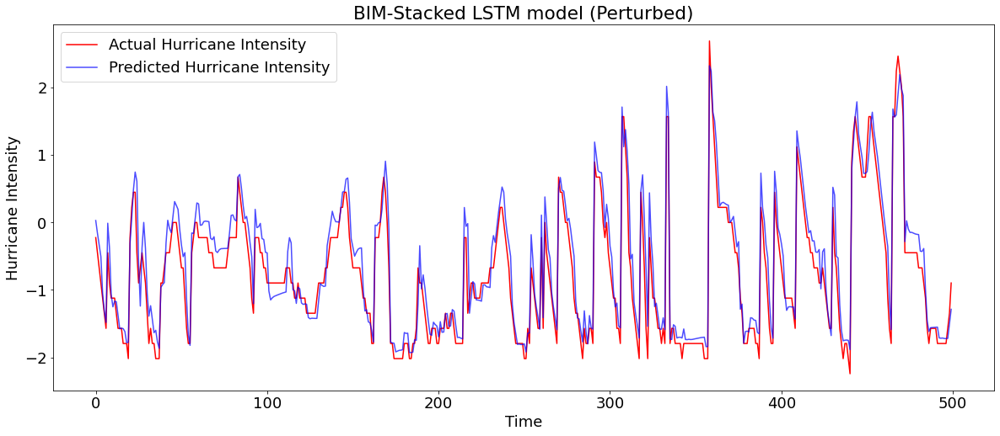

In [276]:

stlstm_bim_predictions=get_result(bim_stlstm, X_bim_perturbed_stlstm, y_test, "BIM-StackedLSTM")
plot_predictions(y_test, stlstm_bim_predictions, yLabel, realLabel, predictedLabel, "BIM-Stacked LSTM model (Perturbed)", xLabel="Time" )


In [277]:
# Create perturbed training set
X_pgd_perturbed_train = pgd(5,epsilon, alpha,X_train, y_train)
X_new_pgd=np.concatenate((X_train,X_pgd_perturbed_train))
pgd_stlstm=stacked_lstm(X_new_pgd,new_Y)

Model: "sequential_57"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_58 (LSTM)              (None, 23, 50)            10400     
                                                                 
 dropout_68 (Dropout)        (None, 23, 50)            0         
                                                                 
 lstm_59 (LSTM)              (None, 23, 30)            9720      
                                                                 
 dropout_69 (Dropout)        (None, 23, 30)            0         
                                                                 
 lstm_60 (LSTM)              (None, 10)                1640      
                                                                 
 dropout_70 (Dropout)        (None, 10)                0         
                                                                 
 dense_62 (Dense)            (None, 1)               

Model - PGD-StackedLSTM:
R^2 Score: 0.9334519058884625
RMSE: 0.23921020968470463


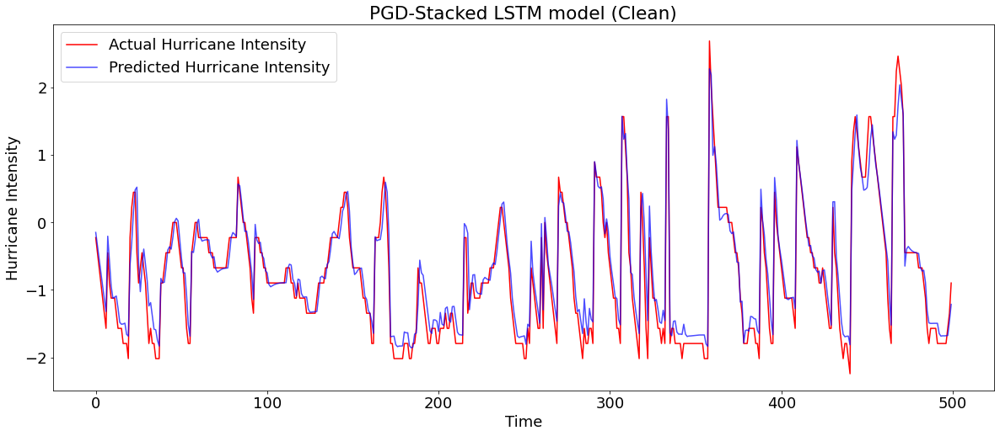

In [278]:
stlstm_pgd_predictions=get_result(pgd_stlstm, X_test, y_test, "PGD-StackedLSTM")
plot_predictions(y_test, stlstm_pgd_predictions, yLabel, realLabel, predictedLabel, "PGD-Stacked LSTM model (Clean)", xLabel="Time" )

Model - PGD-StackedLSTM:
R^2 Score: 0.9055313987502929
RMSE: 0.28500708506377276


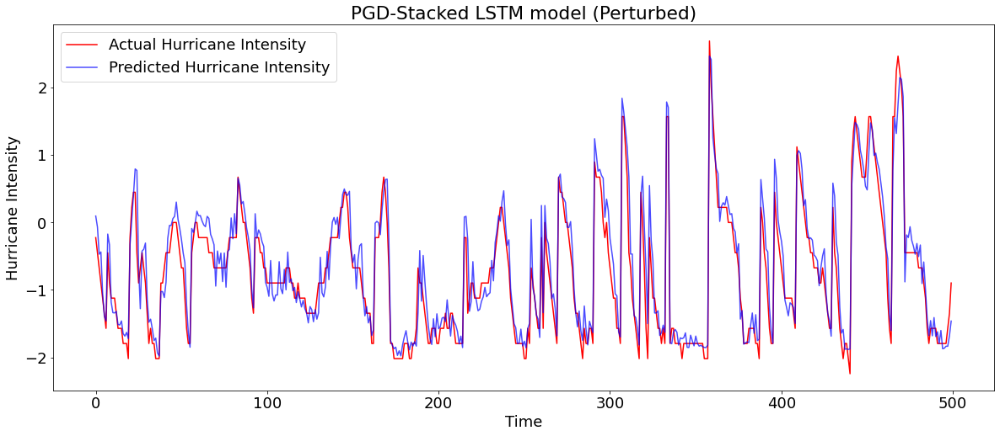

In [279]:
stlstm_pgd_predictions=get_result(pgd_stlstm, X_pgd_perturbed_stlstm, y_test, "PGD-StackedLSTM")
plot_predictions(y_test, stlstm_pgd_predictions, yLabel, realLabel, predictedLabel, "PGD-Stacked LSTM model (Perturbed)", xLabel="Time" )

#### GRU

In [280]:
# Create perturbed training set
X_fgsm_perturbed_train = fgsm(X_train, y_train, epsilon)
X_new_gru=np.concatenate((X_train,X_fgsm_perturbed_train))
fgsm_gru=gru(X_new_gru,new_Y)

Model: "sequential_58"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_9 (GRU)                 (None, 50)                7950      
                                                                 
 dropout_71 (Dropout)        (None, 50)                0         
                                                                 
 dense_63 (Dense)            (None, 1)                 51        
                                                                 
Total params: 8,001
Trainable params: 8,001
Non-trainable params: 0
_________________________________________________________________
Epoch 1/30
200/200 [==============================] - 4s 10ms/step - loss: 0.2937
Epoch 2/30
200/200 [==============================] - 2s 9ms/step - loss: 0.0980
Epoch 3/30
200/200 [==============================] - 2s 8ms/step - loss: 0.0838
Epoch 4/30
200/200 [==============================] - 1s 6ms/step - los

Model - FGSM-GRU:
R^2 Score: 0.9357388445556962
RMSE: 0.23506402618381347


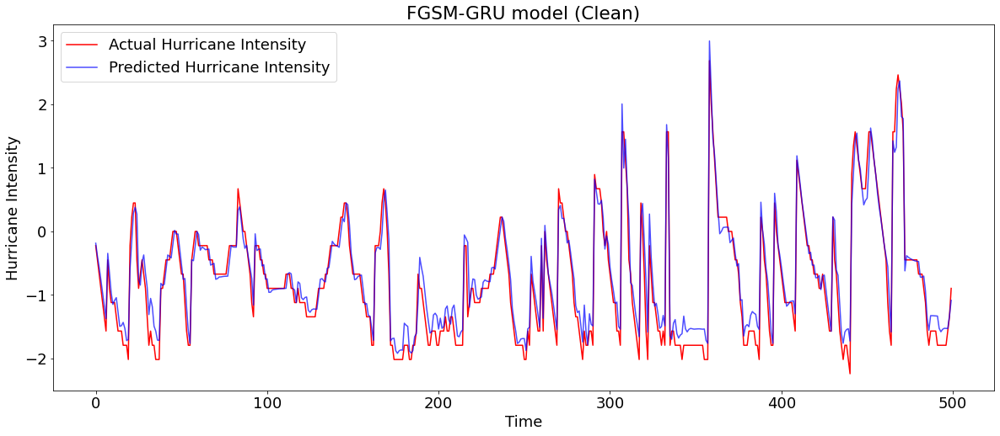

In [281]:
gru_fgsm_predictions=get_result(fgsm_gru, X_test, y_test, "FGSM-GRU")
plot_predictions(y_test, gru_fgsm_predictions, yLabel, realLabel, predictedLabel, "FGSM-GRU model (Clean)", xLabel="Time" )

Model - FGSM-StackedLSTM:
R^2 Score: 0.8992739540208575
RMSE: 0.29429495411593576


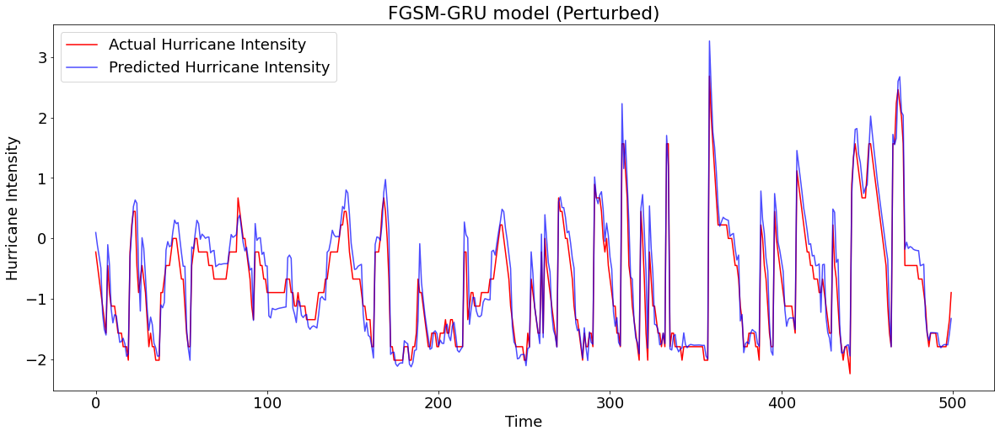

In [282]:
gru_fgsm_predictions=get_result(fgsm_gru, X_fgsm_perturbed_gru, y_test, "FGSM-StackedLSTM")
plot_predictions(y_test, gru_fgsm_predictions, yLabel, realLabel, predictedLabel, "FGSM-GRU model (Perturbed)", xLabel="Time" )


In [283]:
# Create perturbed training set
X_bim_perturbed_train = bim(5,epsilon, alpha,X_train, y_train)
X_new_gru=np.concatenate((X_train,X_bim_perturbed_train))
bim_gru=gru(X_new_gru,new_Y)

Model: "sequential_59"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_10 (GRU)                (None, 50)                7950      
                                                                 
 dropout_72 (Dropout)        (None, 50)                0         
                                                                 
 dense_64 (Dense)            (None, 1)                 51        
                                                                 
Total params: 8,001
Trainable params: 8,001
Non-trainable params: 0
_________________________________________________________________
Epoch 1/30
200/200 [==============================] - 2s 6ms/step - loss: 0.1586
Epoch 2/30
200/200 [==============================] - 1s 7ms/step - loss: 0.0769
Epoch 3/30
200/200 [==============================] - 3s 14ms/step - loss: 0.0680
Epoch 4/30
200/200 [==============================] - 2s 10ms/step - lo

Model - BIM-GRU:
R^2 Score: 0.9370098097532918
RMSE: 0.2327278511359746


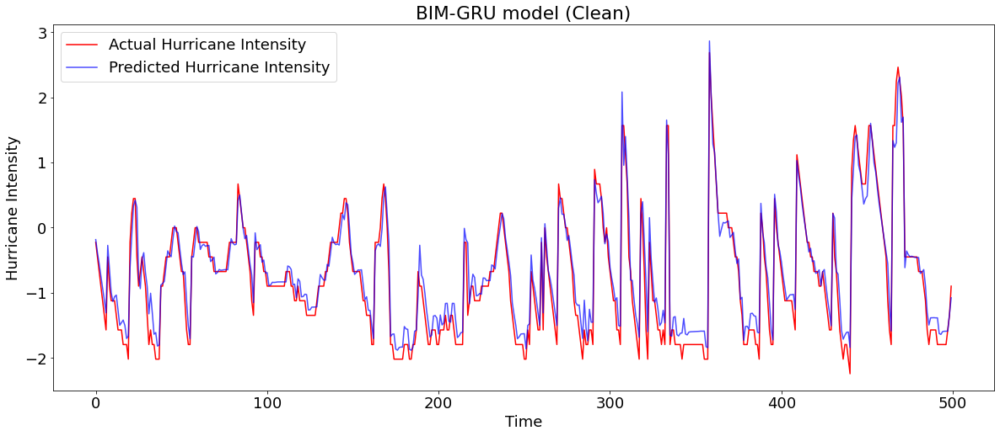

In [284]:
gru_bim_predictions=get_result(bim_gru, X_test, y_test, "BIM-GRU")
plot_predictions(y_test, gru_bim_predictions, yLabel, realLabel, predictedLabel, "BIM-GRU model (Clean)", xLabel="Time" )

Model - BIM-GRU:
R^2 Score: 0.9204277802158376
RMSE: 0.26157285410031716


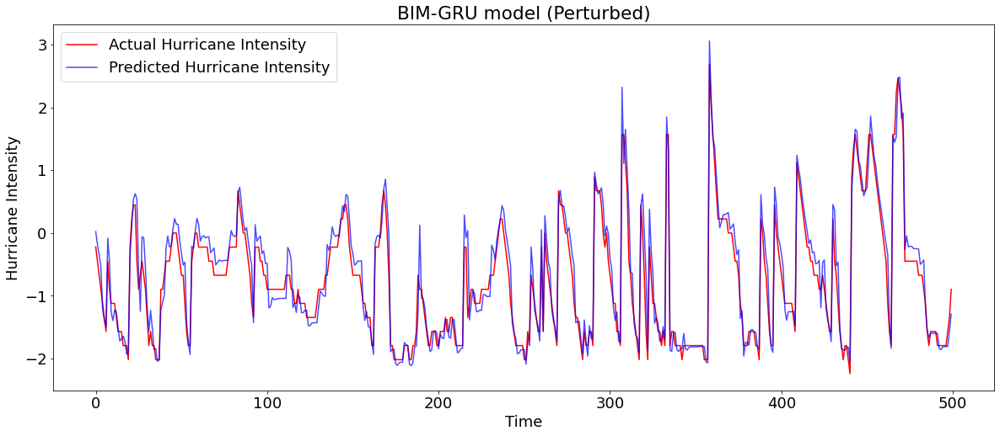

In [285]:
gru_bim_predictions=get_result(bim_gru, X_bim_perturbed_gru, y_test, "BIM-GRU")
plot_predictions(y_test, gru_bim_predictions, yLabel, realLabel, predictedLabel, "BIM-GRU model (Perturbed)", xLabel="Time" )

In [286]:
# Create perturbed training set
X_pgd_perturbed_train = pgd(5,epsilon, alpha,X_train, y_train)
X_new_gru=np.concatenate((X_train,X_pgd_perturbed_train))
pgd_gru=gru(X_new_gru,new_Y)

Model: "sequential_60"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_11 (GRU)                (None, 50)                7950      
                                                                 
 dropout_73 (Dropout)        (None, 50)                0         
                                                                 
 dense_65 (Dense)            (None, 1)                 51        
                                                                 
Total params: 8,001
Trainable params: 8,001
Non-trainable params: 0
_________________________________________________________________
Epoch 1/30
200/200 [==============================] - 2s 6ms/step - loss: 0.1760
Epoch 2/30
200/200 [==============================] - 1s 6ms/step - loss: 0.0818
Epoch 3/30
200/200 [==============================] - 1s 6ms/step - loss: 0.0749
Epoch 4/30
200/200 [==============================] - 1s 6ms/step - loss

Model - PGD-GRU:
R^2 Score: 0.9416930976176743
RMSE: 0.2239091822930665


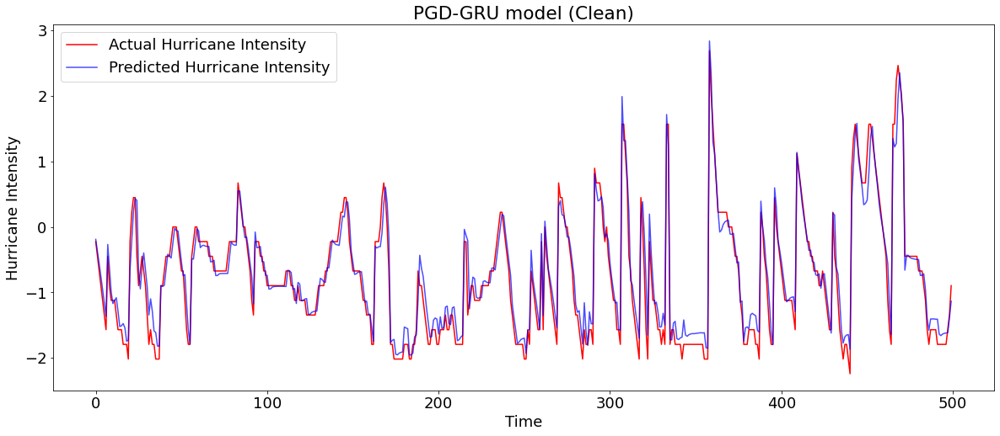

In [287]:
gru_pgd_predictions=get_result(pgd_gru, X_test, y_test, "PGD-GRU")
plot_predictions(y_test, gru_pgd_predictions, yLabel, realLabel, predictedLabel, "PGD-GRU model (Clean)", xLabel="Time" )

Model - PGD-GRU:
R^2 Score: 0.905131354549386
RMSE: 0.28560991648072726


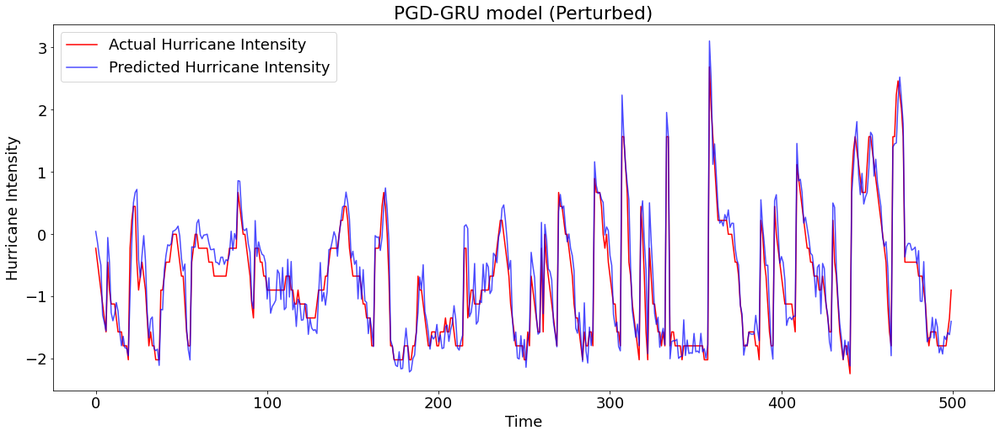

In [288]:
gru_pgd_predictions=get_result(pgd_gru, X_pgd_perturbed_gru, y_test, "PGD-GRU")
plot_predictions(y_test, gru_pgd_predictions, yLabel, realLabel, predictedLabel, "PGD-GRU model (Perturbed)", xLabel="Time" )

#### RNN

In [289]:
# Create perturbed training set
X_fgsm_perturbed_train = fgsm(X_train, y_train, epsilon )
X_new_rnn=np.concatenate((X_train,X_fgsm_perturbed_train))
fgsm_rnn=rnn(X_new_rnn,new_Y)

Model: "sequential_61"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_6 (SimpleRNN)    (None, 50)                2600      
                                                                 
 dropout_74 (Dropout)        (None, 50)                0         
                                                                 
 dense_66 (Dense)            (None, 1)                 51        
                                                                 
Total params: 2,651
Trainable params: 2,651
Non-trainable params: 0
_________________________________________________________________
Epoch 1/30
200/200 [==============================] - 1s 4ms/step - loss: 0.1341
Epoch 2/30
200/200 [==============================] - 1s 3ms/step - loss: 0.0825
Epoch 3/30
200/200 [==============================] - 1s 4ms/step - loss: 0.0746
Epoch 4/30
200/200 [==============================] - 1s 4ms/step - loss

Model - FGSM-RNN:
R^2 Score: 0.9306242572135717
RMSE: 0.2442394056755701


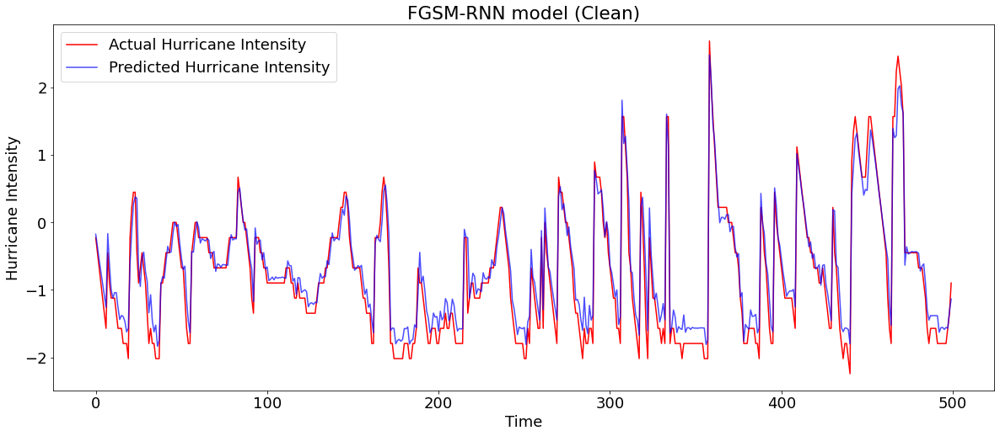

In [290]:
rnn_fgsm_predictions=get_result(fgsm_rnn, X_test, y_test, "FGSM-RNN")
plot_predictions(y_test, rnn_fgsm_predictions, yLabel, realLabel, predictedLabel, "FGSM-RNN model (Clean)", xLabel="Time" )

Model - FGSM-RNN:
R^2 Score: 0.9013317889600259
RMSE: 0.2912732206755676


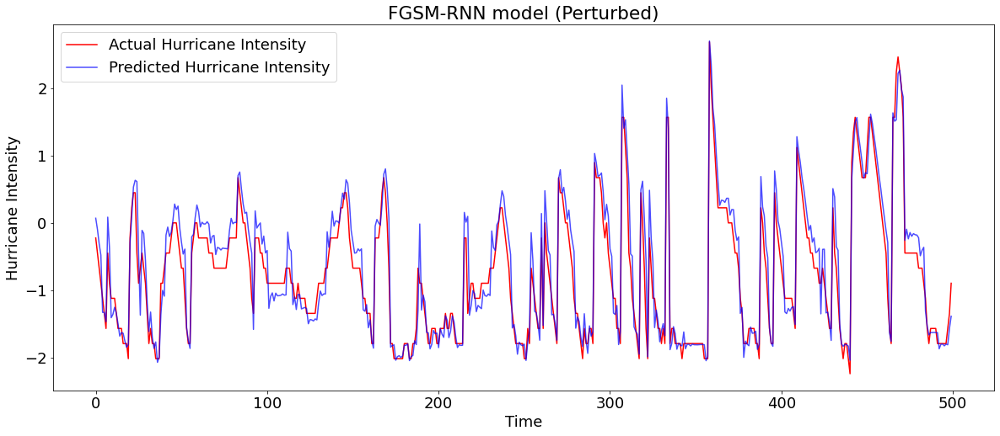

In [291]:
rnn_fgsm_predictions=get_result(fgsm_rnn, X_fgsm_perturbed_rnn, y_test, "FGSM-RNN")
plot_predictions(y_test, rnn_fgsm_predictions, yLabel, realLabel, predictedLabel, "FGSM-RNN model (Perturbed)", xLabel="Time" )

In [292]:
# Create perturbed training set
X_bim_perturbed_train = bim(5,epsilon, alpha,X_train, y_train)
X_new_rnn=np.concatenate((X_train,X_bim_perturbed_train))
bim_rnn=rnn(X_new_rnn,new_Y)

Model: "sequential_62"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_7 (SimpleRNN)    (None, 50)                2600      
                                                                 
 dropout_75 (Dropout)        (None, 50)                0         
                                                                 
 dense_67 (Dense)            (None, 1)                 51        
                                                                 
Total params: 2,651
Trainable params: 2,651
Non-trainable params: 0
_________________________________________________________________
Epoch 1/30
200/200 [==============================] - 2s 6ms/step - loss: 0.1941
Epoch 2/30
200/200 [==============================] - 1s 5ms/step - loss: 0.0878
Epoch 3/30
200/200 [==============================] - 1s 6ms/step - loss: 0.0731
Epoch 4/30
200/200 [==============================] - 1s 6ms/step - loss

Model - BIM-RNN:
R^2 Score: 0.9443629234392579
RMSE: 0.21872279304520692


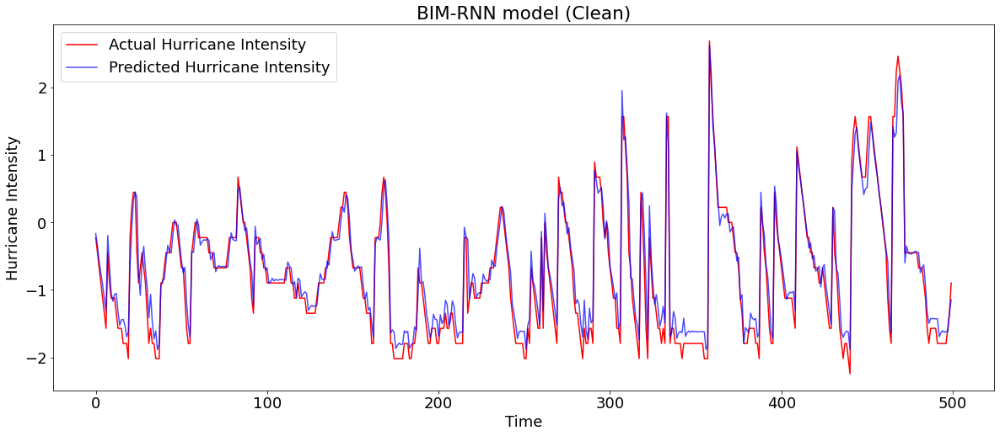

In [293]:
rnn_bim_predictions=get_result(bim_rnn, X_test, y_test, "BIM-RNN")
plot_predictions(y_test, rnn_bim_predictions, yLabel, realLabel, predictedLabel, "BIM-RNN model (Clean)", xLabel="Time" )

Model - BIM-RNN:
R^2 Score: 0.9145845787924222
RMSE: 0.2710067334535081


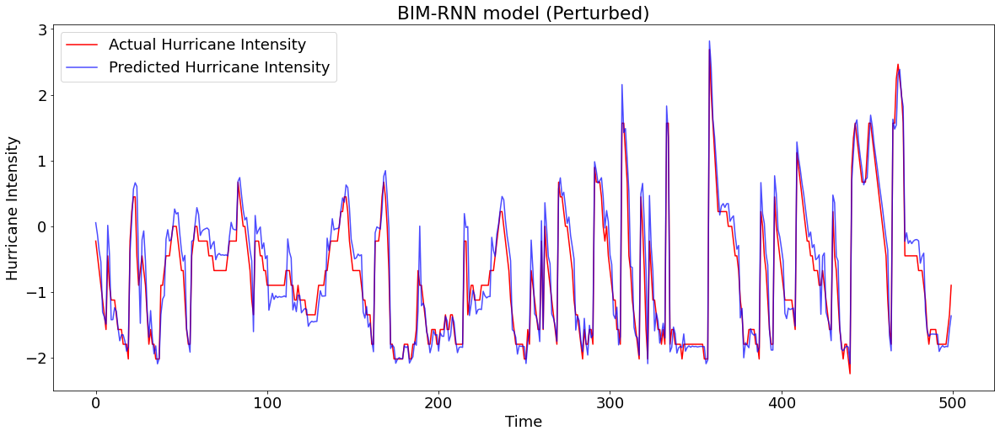

In [294]:
rnn_bim_predictions=get_result(bim_rnn, X_bim_perturbed_rnn, y_test, "BIM-RNN")
plot_predictions(y_test, rnn_bim_predictions, yLabel, realLabel, predictedLabel, "BIM-RNN model (Perturbed)", xLabel="Time" )

In [295]:
# Create perturbed training set
X_pgd_perturbed_train = pgd(5,epsilon, alpha,X_train, y_train)
X_new_rnn=np.concatenate((X_train,X_pgd_perturbed_train))
pgd_rnn=rnn(X_new_rnn,new_Y)

Model: "sequential_63"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_8 (SimpleRNN)    (None, 50)                2600      
                                                                 
 dropout_76 (Dropout)        (None, 50)                0         
                                                                 
 dense_68 (Dense)            (None, 1)                 51        
                                                                 
Total params: 2,651
Trainable params: 2,651
Non-trainable params: 0
_________________________________________________________________
Epoch 1/30
200/200 [==============================] - 1s 4ms/step - loss: 0.1327
Epoch 2/30
200/200 [==============================] - 1s 4ms/step - loss: 0.0775
Epoch 3/30
200/200 [==============================] - 1s 5ms/step - loss: 0.0755
Epoch 4/30
200/200 [==============================] - 1s 4ms/step - loss

Model - PGD-RNN:
R^2 Score: 0.943330565575695
RMSE: 0.2207426862790358


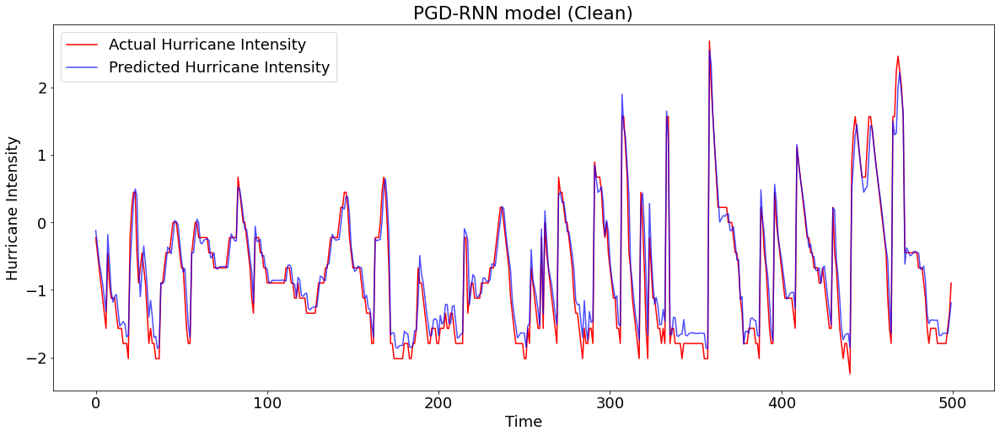

In [296]:
rnn_pgd_predictions=get_result(pgd_rnn, X_test, y_test, "PGD-RNN")
plot_predictions(y_test, rnn_pgd_predictions, yLabel, realLabel, predictedLabel, "PGD-RNN model (Clean)", xLabel="Time" )

Model - PGD-RNN:
R^2 Score: 0.9067962914047837
RMSE: 0.2830926087568368


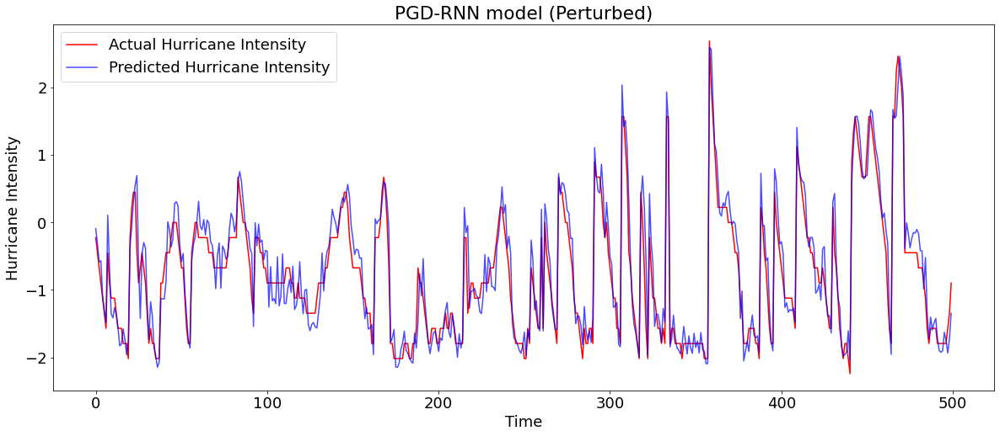

In [297]:
rnn_pgd_predictions=get_result(pgd_rnn, X_pgd_perturbed_rnn, y_test, "PGD-RNN")
plot_predictions(y_test, rnn_pgd_predictions, yLabel, realLabel, predictedLabel, "PGD-RNN model (Perturbed)", xLabel="Time" )

#### CNN

In [298]:
# Create perturbed training set
X_fgsm_perturbed_train = fgsm(X_train, y_train, epsilon )
X_new_cnn=np.concatenate((X_train,X_fgsm_perturbed_train))
fgsm_cnn=cnn(X_new_cnn,new_Y)

Model: "sequential_64"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_10 (Conv1D)          (None, 22, 64)            192       
                                                                 
 max_pooling1d_10 (MaxPoolin  (None, 11, 64)           0         
 g1D)                                                            
                                                                 
 flatten_15 (Flatten)        (None, 704)               0         
                                                                 
 dense_69 (Dense)            (None, 10)                7050      
                                                                 
 dense_70 (Dense)            (None, 1)                 11        
                                                                 
Total params: 7,253
Trainable params: 7,253
Non-trainable params: 0
___________________________________________________

Model - FGSM-CNN:
R^2 Score: 0.9409964082382066
RMSE: 0.2252429071504669


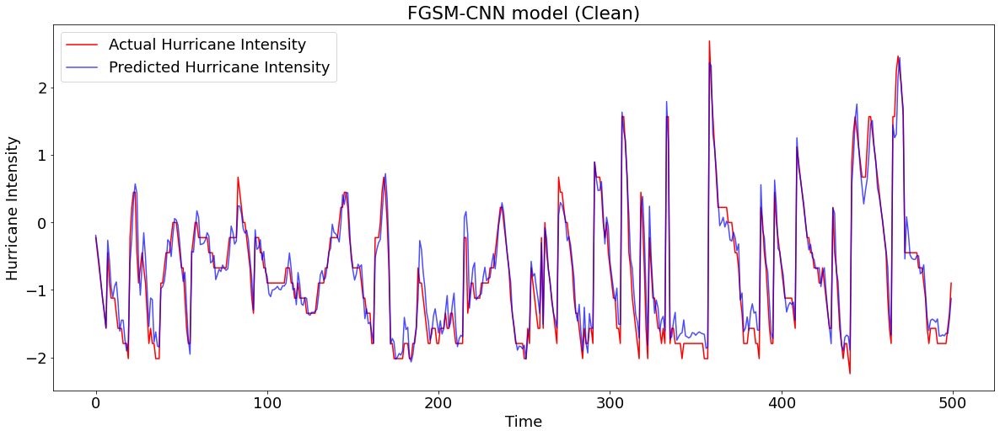

In [299]:
cnn_fgsm_predictions=get_result(fgsm_cnn, X_test, y_test, "FGSM-CNN")
plot_predictions(y_test, cnn_fgsm_predictions, yLabel, realLabel, predictedLabel, "FGSM-CNN model (Clean)", xLabel="Time" )

Model - FGSM-CNN:
R^2 Score: 0.9017962568192393
RMSE: 0.29058685975377757


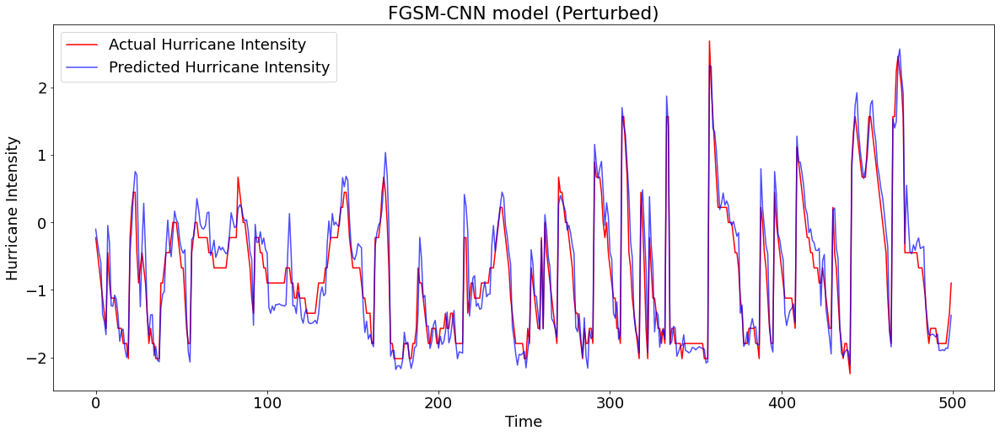

In [300]:
cnn_fgsm_predictions=get_result(fgsm_cnn, X_fgsm_perturbed_cnn, y_test, "FGSM-CNN")
plot_predictions(y_test, cnn_fgsm_predictions, yLabel, realLabel, predictedLabel, "FGSM-CNN model (Perturbed)", xLabel="Time" )

In [301]:
# Create perturbed training set
X_bim_perturbed_train = bim(5,epsilon, alpha,X_train, y_train)
X_new_cnn=np.concatenate((X_train,X_bim_perturbed_train))
bim_cnn=cnn(X_new_cnn,new_Y)

Model: "sequential_65"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_11 (Conv1D)          (None, 22, 64)            192       
                                                                 
 max_pooling1d_11 (MaxPoolin  (None, 11, 64)           0         
 g1D)                                                            
                                                                 
 flatten_16 (Flatten)        (None, 704)               0         
                                                                 
 dense_71 (Dense)            (None, 10)                7050      
                                                                 
 dense_72 (Dense)            (None, 1)                 11        
                                                                 
Total params: 7,253
Trainable params: 7,253
Non-trainable params: 0
___________________________________________________

Model - BIM-CNN:
R^2 Score: 0.9173434826888456
RMSE: 0.26659404478547577


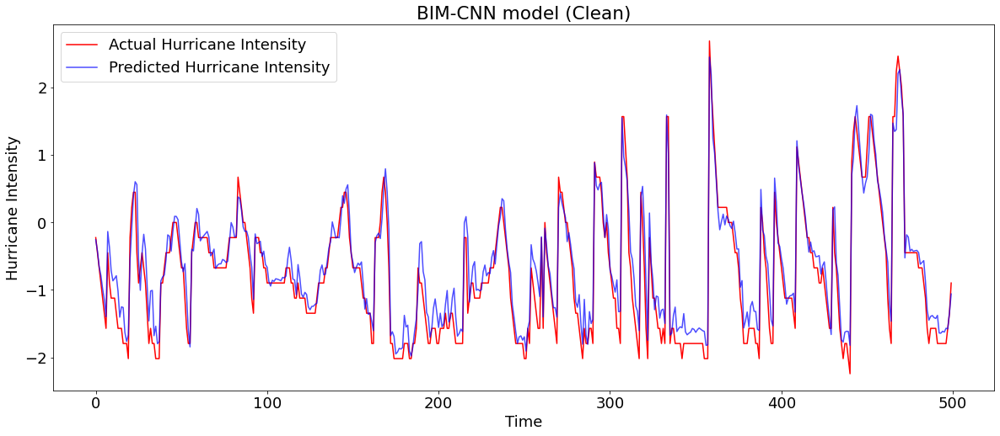

In [302]:
cnn_bim_predictions=get_result(bim_cnn, X_test, y_test, "BIM-CNN")
plot_predictions(y_test, cnn_bim_predictions, yLabel, realLabel, predictedLabel, "BIM-CNN model (Clean)", xLabel="Time" )

Model - BIM-CNN:
R^2 Score: 0.8937979471707114
RMSE: 0.30218881239897


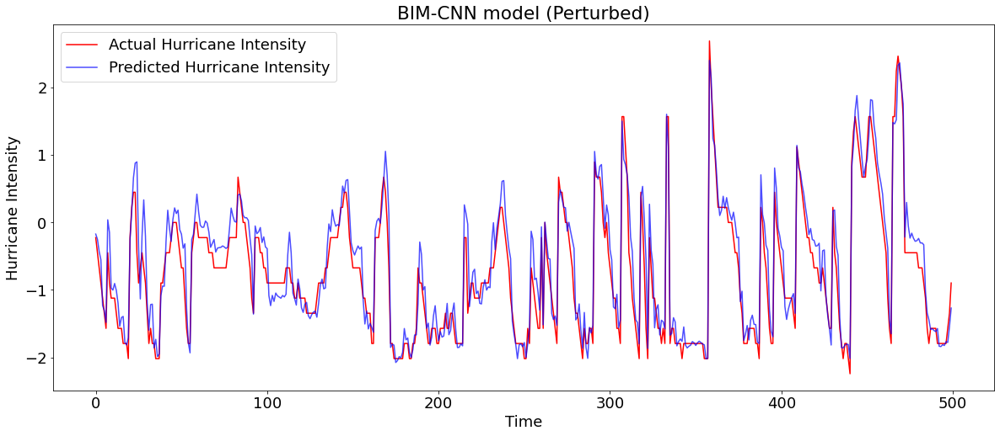

In [303]:
cnn_bim_predictions=get_result(bim_cnn, X_bim_perturbed_cnn, y_test, "BIM-CNN")
plot_predictions(y_test, cnn_bim_predictions, yLabel, realLabel, predictedLabel, "BIM-CNN model (Perturbed)", xLabel="Time" )

In [304]:
# Create perturbed training set
X_pgd_perturbed_train = pgd(5,epsilon, alpha,X_train, y_train)
X_new_cnn=np.concatenate((X_train,X_pgd_perturbed_train))
pgd_cnn=cnn(X_new_cnn,new_Y)

Model: "sequential_66"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_12 (Conv1D)          (None, 22, 64)            192       
                                                                 
 max_pooling1d_12 (MaxPoolin  (None, 11, 64)           0         
 g1D)                                                            
                                                                 
 flatten_17 (Flatten)        (None, 704)               0         
                                                                 
 dense_73 (Dense)            (None, 10)                7050      
                                                                 
 dense_74 (Dense)            (None, 1)                 11        
                                                                 
Total params: 7,253
Trainable params: 7,253
Non-trainable params: 0
___________________________________________________

Model - PGD-CNN:
R^2 Score: 0.9382588509271946
RMSE: 0.23040890320730378


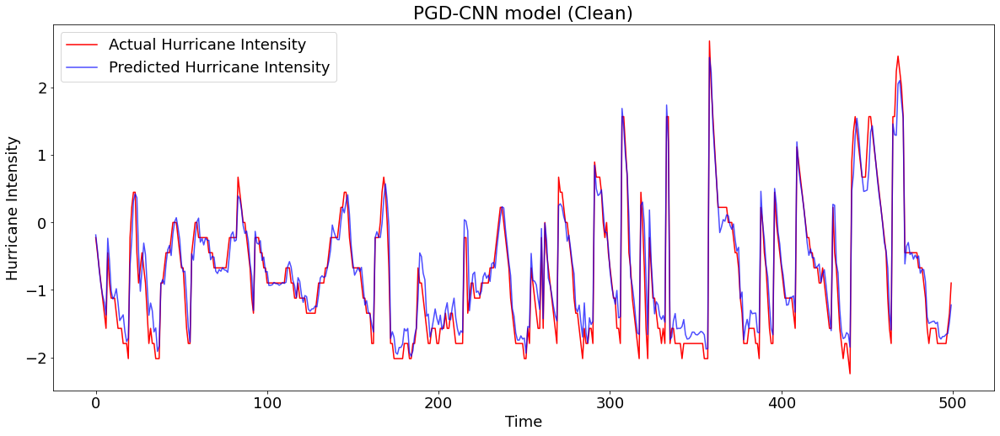

In [305]:
cnn_pgd_predictions=get_result(pgd_cnn, X_test, y_test, "PGD-CNN")
plot_predictions(y_test, cnn_pgd_predictions, yLabel, realLabel, predictedLabel, "PGD-CNN model (Clean)", xLabel="Time" )

Model - PGD-CNN:
R^2 Score: 0.9031374590480072
RMSE: 0.2885956861124323


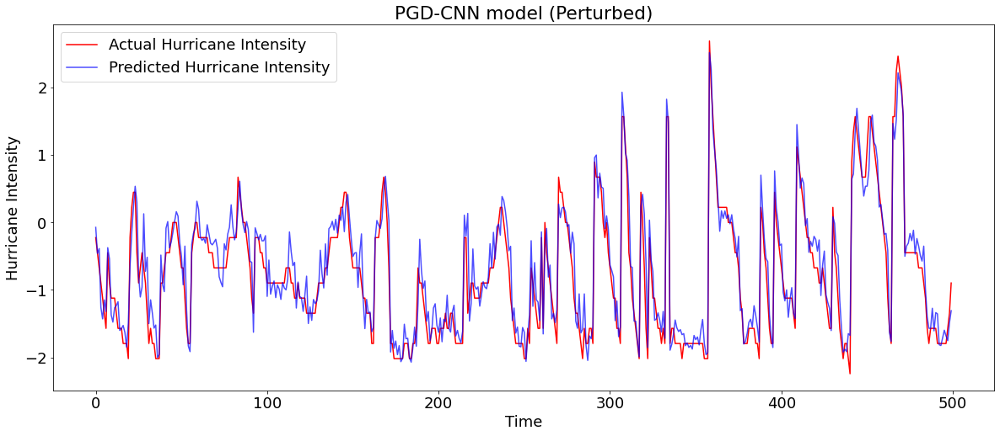

In [306]:
cnn_pgd_predictions=get_result(pgd_cnn, X_pgd_perturbed_cnn, y_test, "PGD-CNN")
plot_predictions(y_test, cnn_pgd_predictions, yLabel, realLabel, predictedLabel, "PGD-CNN model (Perturbed)", xLabel="Time" )

#### CNN_LSTM

In [307]:
# Create perturbed training set
X_fgsm_perturbed_train = fgsm(X_train, y_train, epsilon )
X_new_cnnlstm=np.concatenate((X_train,X_fgsm_perturbed_train))
fgsm_cnnlstm=cnn_lstm(X_new_cnnlstm,new_Y)

Model: "sequential_67"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed_15 (TimeDi  (None, None, 23, 64)     128       
 stributed)                                                      
                                                                 
 time_distributed_16 (TimeDi  (None, None, 11, 64)     0         
 stributed)                                                      
                                                                 
 time_distributed_17 (TimeDi  (None, None, 704)        0         
 stributed)                                                      
                                                                 
 lstm_61 (LSTM)              (None, 20)                58000     
                                                                 
 dense_75 (Dense)            (None, 1)                 21        
                                                     

Model - CNN-LSTM:
R^2 Score: 0.7613831710192744
RMSE: 0.45296271476396277


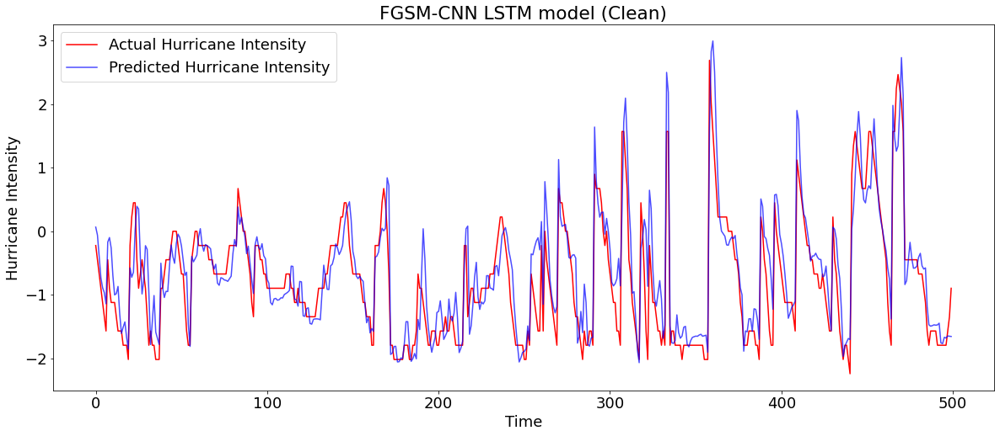

In [308]:
cnnlstm_fgsm_predictions=get_result(fgsm_cnnlstm, X_test.reshape((X_test.shape[0], n_seq, X_test.shape[1], 1)), y_test, "CNN-LSTM")
plot_predictions(y_test, cnnlstm_fgsm_predictions, yLabel, realLabel, predictedLabel, "FGSM-CNN LSTM model (Clean)", xLabel="Time" )

Model - CNN-LSTM:
R^2 Score: 0.6424357323917512
RMSE: 0.5544839404904716


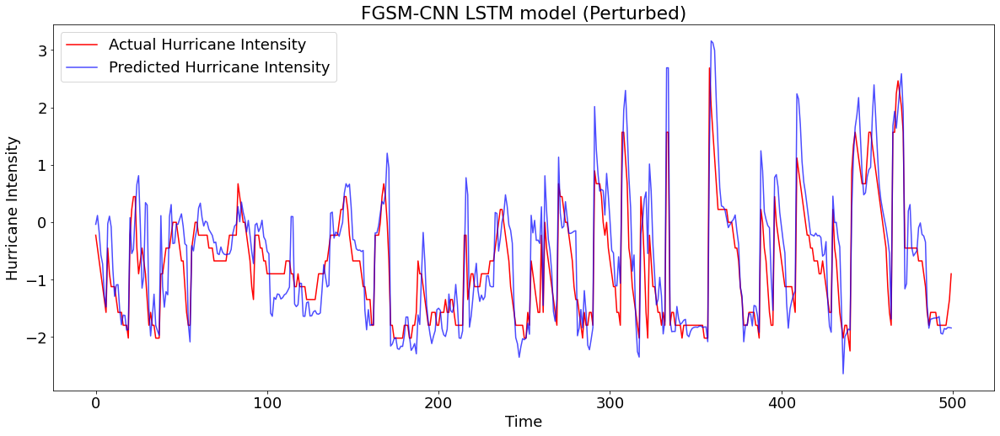

In [309]:
cnnlstm_fgsm_predictions=get_result(fgsm_cnnlstm, X_fgsm_perturbed_cnnlstm.reshape((X_fgsm_perturbed_cnnlstm.shape[0], n_seq, X_bim_perturbed_cnnlstm.shape[1], 1)), y_test, "CNN-LSTM")
plot_predictions(y_test, cnnlstm_fgsm_predictions, yLabel, realLabel, predictedLabel, "FGSM-CNN LSTM model (Perturbed)", xLabel="Time" )

In [310]:
# Create perturbed training set
X_bim_perturbed_train = bim(5,epsilon, alpha,X_train, y_train)
X_new_cnnlstm=np.concatenate((X_train,X_bim_perturbed_train))
bim_cnnlstm=cnn_lstm(X_new_cnnlstm,new_Y)

Model: "sequential_68"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed_18 (TimeDi  (None, None, 23, 64)     128       
 stributed)                                                      
                                                                 
 time_distributed_19 (TimeDi  (None, None, 11, 64)     0         
 stributed)                                                      
                                                                 
 time_distributed_20 (TimeDi  (None, None, 704)        0         
 stributed)                                                      
                                                                 
 lstm_62 (LSTM)              (None, 20)                58000     
                                                                 
 dense_76 (Dense)            (None, 1)                 21        
                                                     

Model - CNN-LSTM:
R^2 Score: 0.7309934617251262
RMSE: 0.4809426862252382


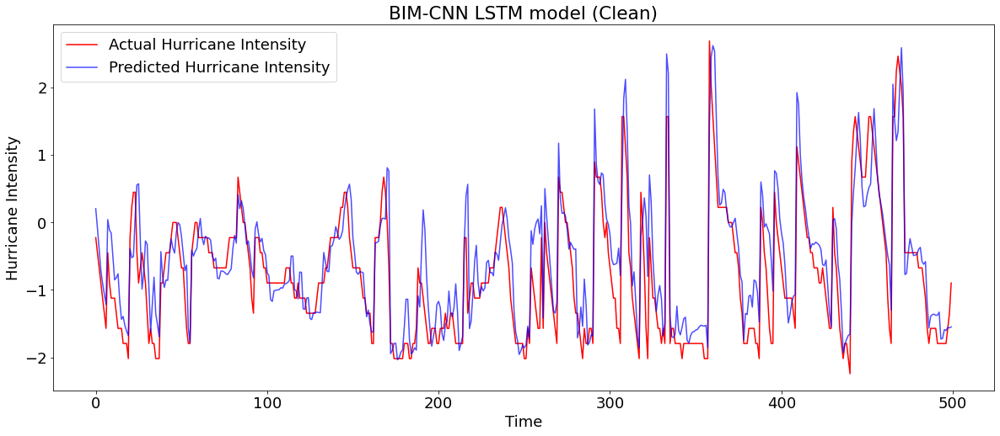

In [311]:
cnnlstm_bim_predictions=get_result(bim_cnnlstm, X_test.reshape((X_test.shape[0], n_seq, X_test.shape[1], 1)), y_test, "CNN-LSTM")
plot_predictions(y_test, cnnlstm_bim_predictions, yLabel, realLabel, predictedLabel, "BIM-CNN LSTM model (Clean)", xLabel="Time" )

Model - CNN-LSTM:
R^2 Score: 0.6204516217280706
RMSE: 0.5712753424667942


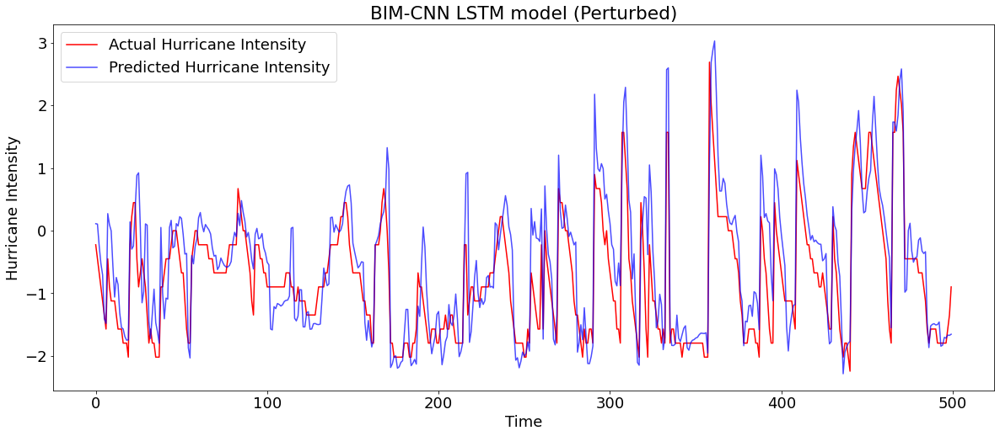

In [312]:
cnnlstm_bim_predictions=get_result(bim_cnnlstm, X_bim_perturbed_cnnlstm.reshape((X_bim_perturbed_cnnlstm.shape[0], n_seq, X_bim_perturbed_cnnlstm.shape[1], 1)), y_test, "CNN-LSTM")
plot_predictions(y_test, cnnlstm_bim_predictions, yLabel, realLabel, predictedLabel, "BIM-CNN LSTM model (Perturbed)", xLabel="Time" )

In [313]:
# Create perturbed training set
X_pgd_perturbed_train = pgd(5,epsilon, alpha,X_train, y_train)
X_new_cnnlstm=np.concatenate((X_train,X_pgd_perturbed_train))
pgd_cnnlstm=cnn_lstm(X_new_cnnlstm,new_Y)

Model: "sequential_69"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed_21 (TimeDi  (None, None, 23, 64)     128       
 stributed)                                                      
                                                                 
 time_distributed_22 (TimeDi  (None, None, 11, 64)     0         
 stributed)                                                      
                                                                 
 time_distributed_23 (TimeDi  (None, None, 704)        0         
 stributed)                                                      
                                                                 
 lstm_63 (LSTM)              (None, 20)                58000     
                                                                 
 dense_77 (Dense)            (None, 1)                 21        
                                                     

Model - CNN-LSTM:
R^2 Score: 0.769072421282623
RMSE: 0.4456047638288344


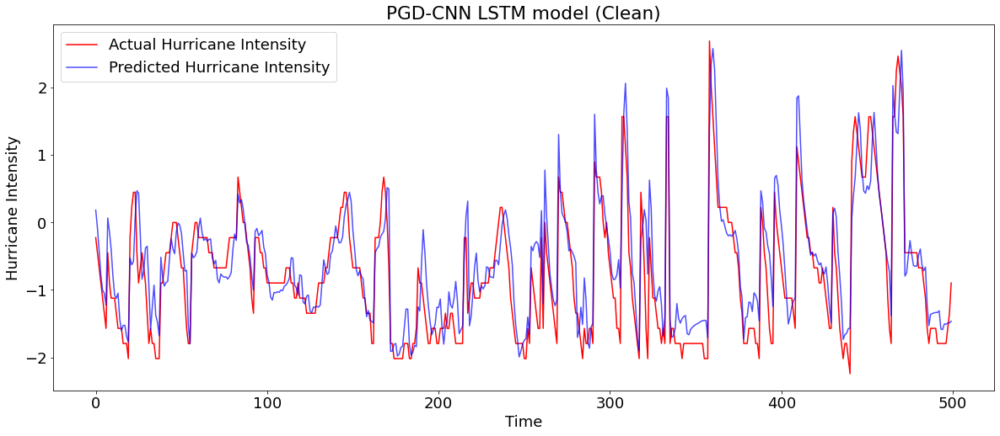

In [314]:
cnnlstm_pgd_predictions=get_result(pgd_cnnlstm, X_test.reshape((X_test.shape[0], n_seq, X_test.shape[1], 1)), y_test, "CNN-LSTM")
plot_predictions(y_test, cnnlstm_pgd_predictions, yLabel, realLabel, predictedLabel, "PGD-CNN LSTM model (Clean)", xLabel="Time" )

Model - CNN-LSTM:
R^2 Score: 0.7020703264943748
RMSE: 0.5061378448959223


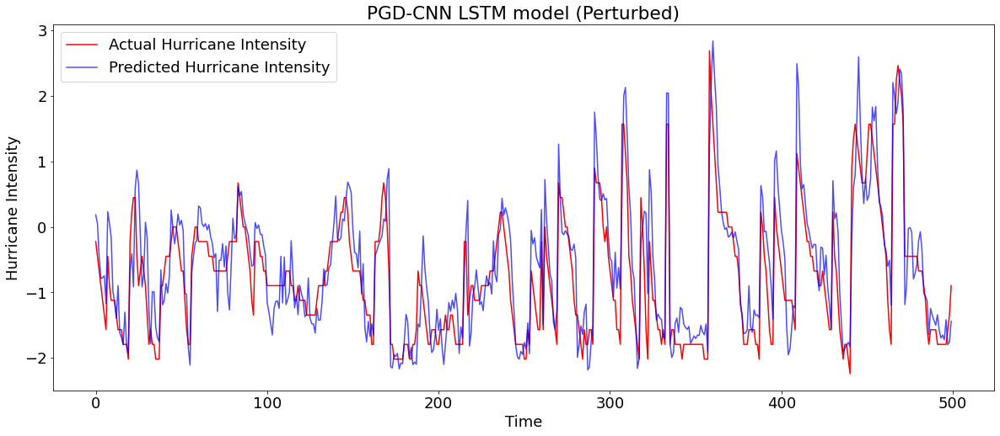

In [315]:
cnnlstm_pgd_predictions=get_result(pgd_cnnlstm, X_pgd_perturbed_cnnlstm.reshape((X_pgd_perturbed_cnnlstm.shape[0], n_seq, X_pgd_perturbed_cnnlstm.shape[1], 1)), y_test, "CNN-LSTM")
plot_predictions(y_test, cnnlstm_pgd_predictions, yLabel, realLabel, predictedLabel, "PGD-CNN LSTM model (Perturbed)", xLabel="Time"  )

#### ConvLSTM

In [316]:
# Create perturbed training set
X_fgsm_perturbed_train = fgsm(X_train, y_train, epsilon )
X_new_convlstm=np.concatenate((X_train,X_fgsm_perturbed_train))
fgsm_convlstm=convlstm(X_new_convlstm,new_Y)

Model: "sequential_70"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_5 (ConvLSTM2D)  (None, 1, 22, 64)         33536     
                                                                 
 flatten_21 (Flatten)        (None, 1408)              0         
                                                                 
 dense_78 (Dense)            (None, 1)                 1409      
                                                                 
Total params: 34,945
Trainable params: 34,945
Non-trainable params: 0
_________________________________________________________________
Epoch 1/30
200/200 [==============================] - 4s 9ms/step - loss: 0.3708
Epoch 2/30
200/200 [==============================] - 1s 6ms/step - loss: 0.1208
Epoch 3/30
200/200 [==============================] - 1s 5ms/step - loss: 0.0870
Epoch 4/30
200/200 [==============================] - 1s 5ms/step - lo

Model - ConvLSTM:
R^2 Score: 0.9367299204119517
RMSE: 0.2332443303137718


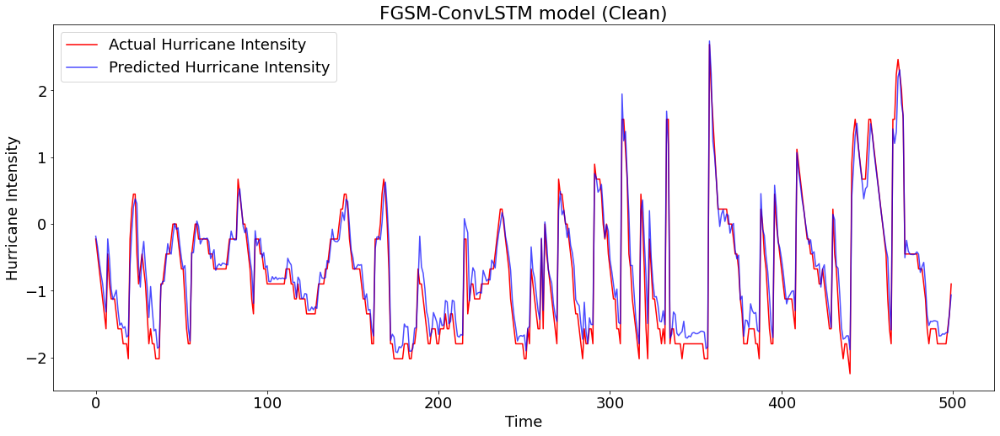

In [317]:
convlstm_fgsm_predictions=get_result(fgsm_convlstm, X_test.reshape((X_test.shape[0], n_seq,1, X_test.shape[1], 1)), y_test, "ConvLSTM")
plot_predictions(y_test, convlstm_fgsm_predictions, yLabel, realLabel, predictedLabel, "FGSM-ConvLSTM model (Clean)", xLabel="Time" )

Model - ConvLSTM:
R^2 Score: 0.893500439633935
RMSE: 0.30261179995908266


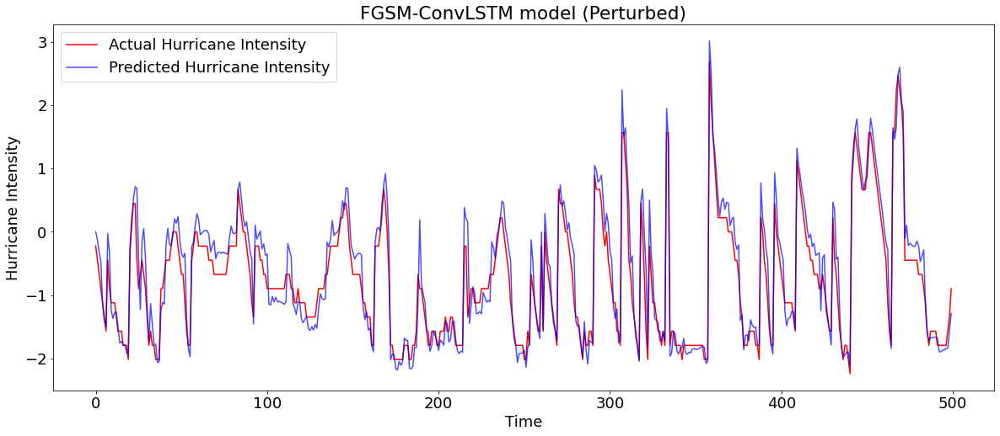

In [318]:
convlstm_fgsm_predictions=get_result(fgsm_convlstm, X_fgsm_perturbed_convlstm.reshape((X_fgsm_perturbed_convlstm.shape[0], n_seq,1, X_bim_perturbed_convlstm.shape[1], 1)), y_test, "ConvLSTM")
plot_predictions(y_test, convlstm_fgsm_predictions, yLabel, realLabel, predictedLabel, "FGSM-ConvLSTM model (Perturbed)", xLabel="Time" )

In [319]:
# Create perturbed training set
X_bim_perturbed_train = bim(5,epsilon, alpha,X_train, y_train)
X_new_convlstm=np.concatenate((X_train,X_bim_perturbed_train))
bim_convlstm=convlstm(X_new_convlstm,new_Y)

Model: "sequential_71"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_6 (ConvLSTM2D)  (None, 1, 22, 64)         33536     
                                                                 
 flatten_22 (Flatten)        (None, 1408)              0         
                                                                 
 dense_79 (Dense)            (None, 1)                 1409      
                                                                 
Total params: 34,945
Trainable params: 34,945
Non-trainable params: 0
_________________________________________________________________
Epoch 1/30
200/200 [==============================] - 2s 5ms/step - loss: 0.3811
Epoch 2/30
200/200 [==============================] - 1s 6ms/step - loss: 0.1216
Epoch 3/30
200/200 [==============================] - 1s 6ms/step - loss: 0.0887
Epoch 4/30
200/200 [==============================] - 1s 6ms/step - lo

Model - ConvLSTM:
R^2 Score: 0.9149748157728856
RMSE: 0.27038692706604095


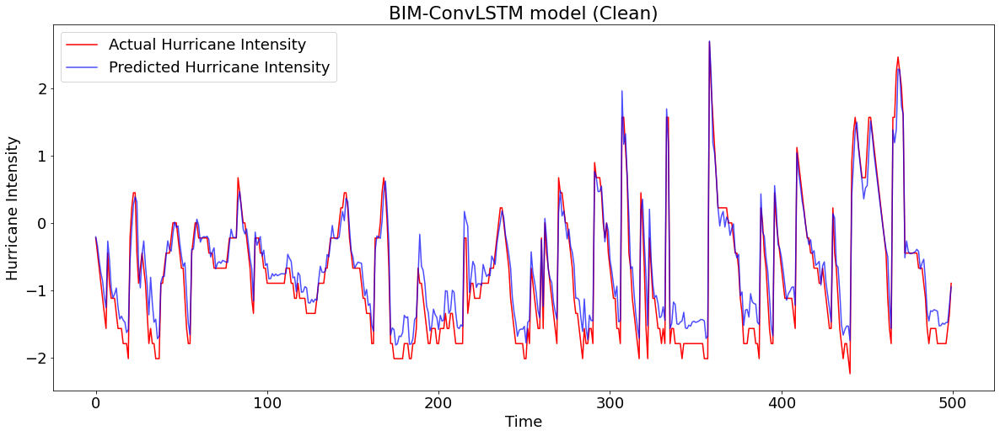

In [320]:
convlstm_bim_predictions=get_result(bim_convlstm, X_test.reshape((X_test.shape[0], n_seq,1, X_test.shape[1], 1)), y_test, "ConvLSTM")
plot_predictions(y_test, convlstm_bim_predictions, yLabel, realLabel, predictedLabel, "BIM-ConvLSTM model (Clean)", xLabel="Time" )

Model - ConvLSTM:
R^2 Score: 0.912733299525917
RMSE: 0.27392784838652967


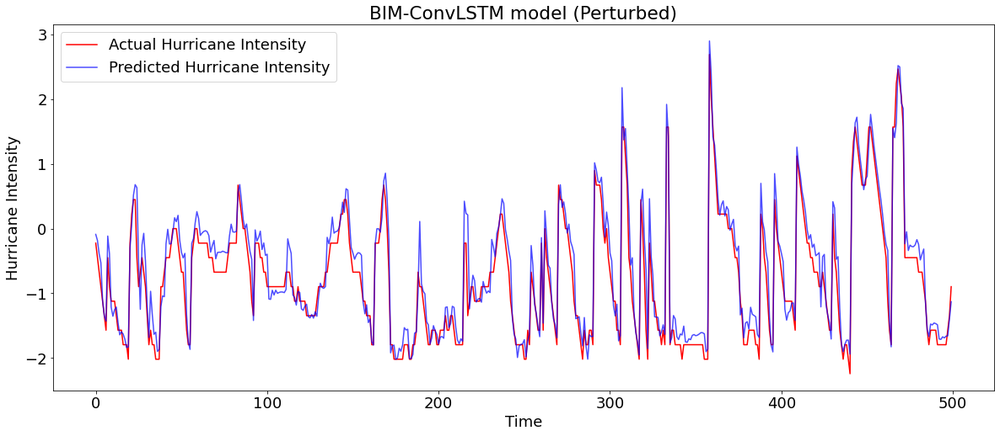

In [321]:
convlstm_bim_predictions=get_result(bim_convlstm, X_bim_perturbed_convlstm.reshape((X_bim_perturbed_convlstm.shape[0], n_seq,1, X_bim_perturbed_convlstm.shape[1], 1)), y_test, "ConvLSTM")
plot_predictions(y_test, convlstm_bim_predictions, yLabel, realLabel, predictedLabel, "BIM-ConvLSTM model (Perturbed)", xLabel="Time" )

In [322]:
X_pgd_perturbed_train = pgd(5,epsilon, alpha,X_train, y_train)
X_new_convlstm=np.concatenate((X_train,X_pgd_perturbed_train))
pgd_convlstm=convlstm(X_new_convlstm,new_Y)

Model: "sequential_72"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_7 (ConvLSTM2D)  (None, 1, 22, 64)         33536     
                                                                 
 flatten_23 (Flatten)        (None, 1408)              0         
                                                                 
 dense_80 (Dense)            (None, 1)                 1409      
                                                                 
Total params: 34,945
Trainable params: 34,945
Non-trainable params: 0
_________________________________________________________________
Epoch 1/30
200/200 [==============================] - 2s 5ms/step - loss: 0.3680
Epoch 2/30
200/200 [==============================] - 1s 6ms/step - loss: 0.1204
Epoch 3/30
200/200 [==============================] - 1s 6ms/step - loss: 0.0867
Epoch 4/30
200/200 [==============================] - 1s 6ms/step - lo

Model - ConvLSTM:
R^2 Score: 0.9294253443043335
RMSE: 0.24634074879586462


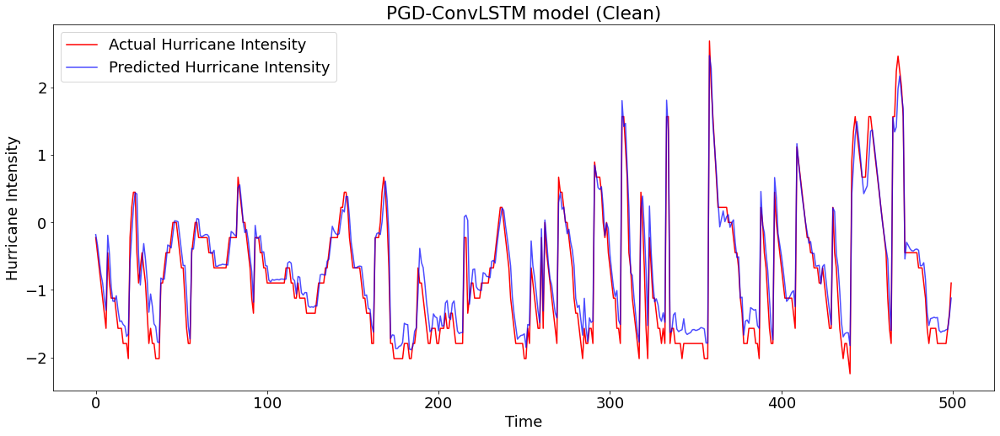

In [323]:
convlstm_pgd_predictions=get_result(pgd_convlstm, X_test.reshape((X_test.shape[0], n_seq,1, X_test.shape[1], 1)), y_test, "ConvLSTM")
plot_predictions(y_test, convlstm_pgd_predictions, yLabel, realLabel, predictedLabel, "PGD-ConvLSTM model (Clean)", xLabel="Time" )

Model - ConvLSTM:
R^2 Score: 0.8954064360410758
RMSE: 0.2998916673762906


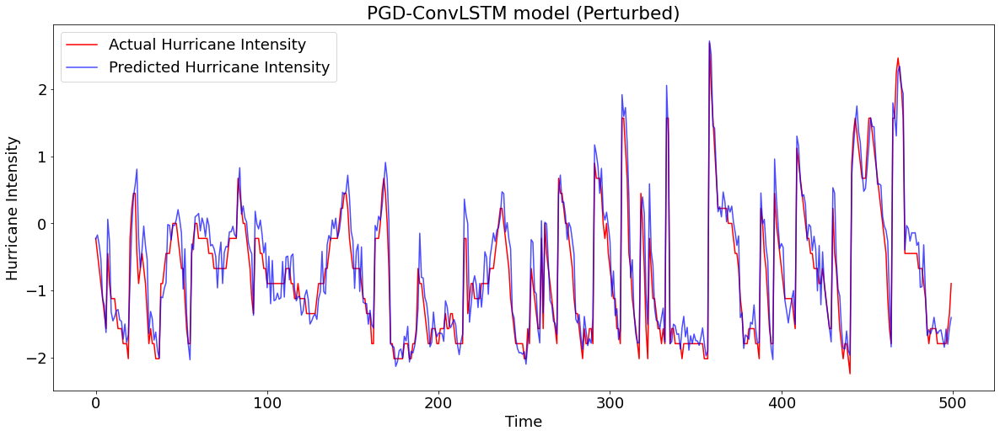

In [324]:
convlstm_pgd_predictions=get_result(pgd_convlstm, X_pgd_perturbed_convlstm.reshape((X_pgd_perturbed_convlstm.shape[0], n_seq,1, X_pgd_perturbed_convlstm.shape[1], 1)), y_test, "ConvLSTM")
plot_predictions(y_test, convlstm_pgd_predictions, yLabel, realLabel, predictedLabel, "PGD-ConvLSTM model (Perturbed)", xLabel="Time" )